In [1]:
import pandas as pd
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import os
from sklearn.datasets import load_iris
from linearmodels.iv import IV2SLS
from statsmodels.formula.api import quantreg, wls
from statsmodels.iolib.summary2 import summary_col
from PIL import Image
from statsmodels.stats.stattools import durbin_watson
from collections import OrderedDict
from linearmodels.iv.results import compare
import doubleml as dml
from sklearn.ensemble import RandomForestRegressor
from sklearn.base import clone
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from doubleml import DoubleMLData, DoubleMLClusterData, DoubleMLPLIV
from doubleml.utils import DMLDummyRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import holidays
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from sklearn.inspection import permutation_importance
from xgboost import XGBRegressor
import xgboost as xgb
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LassoCV

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-cylp4nc8 because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
def dml_rolling_window(filtered_data, base_covariates, manual_params_l=None, manual_params_r = None, manual_params_m=None, param_dist_xgb=None, param_dist_xgb_r=None, param_dist_xgb_m=None, dependent_variable = 'consumption_normalized'):
    
    data = filtered_data.copy()
    
    covariates = base_covariates.copy()
    

    # Initialize lists to collect predictions and time indices
    predictions_ml_l = []
    predictions_ml_r = []
    predictions_ml_m = []
    time_indices = []
    train_predictions = []
    train_actuals = []
    test_predictions = []
    test_actuals = []
    feature_importances_per_window = []
    fold_metrics = []
    test_years = []
    fold_feature_importance_df = []
    fold_coefficients = []

    

    train_test_pairs = [
    (2015, 2016, 2017),
    (2016, 2017, 2018),
    (2017, 2018, 2019),
    (2018, 2019, 2020),
    (2019, 2020, 2021),
    (2020, 2021, 2022),
    (2021, 2022, 2023),
    (2022, 2023, 2024)]
    
    
    def tune_xgb_model(X, y, param_dist_xgb):
        tscv = TimeSeriesSplit(n_splits=3)
        model = xgb.XGBRegressor(objective="reg:squarederror", tree_method="hist", eval_metric="rmse")
        grid_search = GridSearchCV(model, param_dist_xgb, cv=tscv, n_jobs=-1)
        grid_search.fit(X, y)
        return grid_search.best_params_
        
    best_params_xgb = None  # Store best params from first window
    best_params_xgb_treat = None
    best_params_xgb_inst = None
    lasso_param = None
    
    data['Year'] = data['Time'].dt.year
    year_to_indices = data.groupby('Year').indices

    
    
    for train_start, train_end, test_year in train_test_pairs:
        train_indices = []
        for y in range(train_start, train_end + 1):
            if y in year_to_indices:
                train_indices.extend(year_to_indices[y])

        test_indices = year_to_indices.get(test_year, [])

        if len(train_indices) == 0 or len(test_indices) == 0:
            print(f"Skipping test year {test_year} due to insufficient data.")
            continue
        
        train_data = data.iloc[train_indices]
        test_data = data.iloc[test_indices]



        print(f"\nTest Year: {test_year} | Training Years: {train_start} to {train_end}")
        print(f"Train samples: {len(train_indices)} | Test samples: {len(test_indices)}")


        X_train = train_data[covariates]
        y_train_ml_l = train_data[dependent_variable]
        d_train_ml_r = train_data['DayAheadPriceEUR']
        z_train_ml_m_1 = train_data['Total_Wind_Generation']
        
        
        if best_params_xgb is None and manual_params_l is None:
            best_params_xgb = tune_xgb_model(X_train, y_train_ml_l, param_dist_xgb)
            print("Best L Parameters:", best_params_xgb)
        
        if best_params_xgb_treat is None and manual_params_r is None:
            best_params_xgb_treat = tune_xgb_model(X_train, d_train_ml_r, param_dist_xgb_r)
            print("Best R Parameters:", best_params_xgb_treat)
            
            
        if best_params_xgb_inst is None and manual_params_m is None:
            best_params_xgb_inst = tune_xgb_model(X_train, z_train_ml_m_1, param_dist_xgb_m)
            print("Best M Parameters:", best_params_xgb_inst)
            
        learner_l = xgb.XGBRegressor(**(manual_params_l if manual_params_l else best_params_xgb))
        learner_r = xgb.XGBRegressor(**(manual_params_r if manual_params_r else best_params_xgb_treat))
        learner_m = xgb.XGBRegressor(**(manual_params_m if manual_params_m else best_params_xgb_inst))
            # Train each model on the training set (fixed window)
        learner_l.fit(X_train, y_train_ml_l)
        learner_r.fit(X_train, d_train_ml_r)
        learner_m.fit(X_train, z_train_ml_m_1)
            
        feature_importances_per_window.append(learner_l.feature_importances_)

            # Predict on the test set (next year)
        X_test = test_data[covariates]
        y_test_ml_l = test_data[dependent_variable]
        d_test_ml_r = test_data['DayAheadPriceEUR']
        z_test_ml_m_1 = test_data['Total_Wind_Generation']
        pred_l = learner_l.predict(X_test)
        pred_r = learner_r.predict(X_test)
        pred_m = learner_m.predict(X_test)
            
            # Predict on the train set (next year)
        train_predictions.extend(learner_l.predict(X_train))
        train_actuals.extend(y_train_ml_l)
        test_predictions.extend(learner_l.predict(X_test))
        test_actuals.extend(y_test_ml_l)

            # Append predictions and indices to the lists
        predictions_ml_l.extend(pred_l)
        predictions_ml_r.extend(pred_r)
        predictions_ml_m.extend(pred_m)
        time_indices.extend(test_data.index.tolist())
        
        plt.figure(figsize=(12, 4))
        plt.plot(test_actuals[:500], label='Actual')
        plt.plot(test_predictions[:500], label='Predicted')
        plt.title("First 500 test predictions vs actuals")
        plt.legend()
        plt.show()
        
        fold_mae = mean_absolute_error(y_test_ml_l, pred_l)
        fold_rmse = mean_squared_error(y_test_ml_l, pred_l, squared=False)
        fold_r2 = r2_score(y_test_ml_l, pred_l)
        fold_rr = r2_score(d_test_ml_r, pred_r)
        fold_rz = r2_score(z_test_ml_m_1, pred_m)
        print("Test error l:", fold_r2)
        print("Test error r:", fold_rr)
        print("Test error m:", fold_rz)
        
        fold_metrics.append({
            'Test Year': test_year,
            'MAE': fold_mae,
            'RMSE': fold_rmse,
            'R2': fold_r2
        })
        test_years.append(test_year)
        
        fold_feature_importance_df.append(pd.DataFrame({
            'Feature': covariates,
            'Importance': learner_l.feature_importances_,
            'Year': test_year
        }))
        
        dml_data_fold = dml.DoubleMLClusterData(
            test_data.reset_index(drop=True),
            y_col=dependent_variable,
            d_cols='DayAheadPriceEUR',
            z_cols='Total_Wind_Generation',
            x_cols=covariates,
            cluster_cols=['Country']
        )
        
        dml_fold = dml.DoubleMLPLIV(dml_data_fold, dml.utils.DMLDummyRegressor(), dml.utils.DMLDummyRegressor(), dml.utils.DMLDummyRegressor())
        dml_fold.fit(external_predictions={
            'DayAheadPriceEUR': {
                'ml_l': pred_l.reshape(-1, 1),
                'ml_r': pred_r.reshape(-1, 1),
                'ml_m': pred_m.reshape(-1, 1)
            }
        })
        fold_coefficients.append({
            'Year': test_year,
            'coef': dml_fold.coef,
            'se': dml_fold.se,
            't': dml_fold.t_stat,
            'p': dml_fold.pval,
        })


    # Calculate metrics for the entire model
    train_mae = mean_absolute_error(train_actuals, train_predictions)
    train_rmse = mean_squared_error(train_actuals, train_predictions, squared=False)
    train_r2 = r2_score(train_actuals, train_predictions)

    test_mae = mean_absolute_error(test_actuals, test_predictions)
    test_rmse = mean_squared_error(test_actuals, test_predictions, squared=False)
    test_r2 = r2_score(test_actuals, test_predictions)

    print("Overall Train Metrics:")
    print(f"MAE: {train_mae}, RMSE: {train_rmse}, R²: {train_r2}")

    print("Overall Test Metrics:")
    print(f"MAE: {test_mae}, RMSE: {test_rmse}, R²: {test_r2}")

    
    
    feature_importances_array = np.array(feature_importances_per_window)
    mean_importances = feature_importances_array.mean(axis=0)
    std_importances = feature_importances_array.std(axis=0)
    importance_df = pd.DataFrame({
        'Feature': covariates,
        'Mean Importance': mean_importances,
        'Std Importance': std_importances
    }).sort_values(by='Mean Importance', ascending=False)
    

    # Convert predictions lists to numpy arrays
    filtered_data = data.loc[data.index.isin(time_indices)].copy()
    
    #### predictins dataset? original dataset?

    predictions_ml_l = np.array(predictions_ml_l).reshape(-1, 1)
    predictions_ml_r = np.array(predictions_ml_r).reshape(-1, 1)
    predictions_ml_m = np.array(predictions_ml_m).reshape(-1, 1)


    pred_dict = {
        'DayAheadPriceEUR': {
            'ml_l': predictions_ml_l,
            'ml_r': predictions_ml_r,
            'ml_m': predictions_ml_m
        }
    }

    # Initialize DoubleML data object
    obj_dml_data = dml.DoubleMLClusterData(
        filtered_data,
        y_col=dependent_variable,
        d_cols='DayAheadPriceEUR',
        z_cols='Total_Wind_Generation',  # Use original instruments (not the lags) for DoubleML
        x_cols=covariates,
        cluster_cols=['Country']
    )
    # Use dummy regressors for DoubleML
    ml_l = dml.utils.DMLDummyRegressor()
    ml_m = dml.utils.DMLDummyRegressor()
    ml_r = dml.utils.DMLDummyRegressor()

    # Initialize and fit DoubleML with external predictions
    dml_pliv_obj = dml.DoubleMLPLIV(obj_dml_data, ml_l, ml_m, ml_r)
    dml_pliv_obj.fit(external_predictions=pred_dict)

    print(dml_pliv_obj)
    filtered_data["Prrediction"] = dml_pliv_obj.predictions["ml_l"].ravel()
    filtered_data["Residuals"] = dml_pliv_obj.predictions["ml_l"].ravel() - filtered_data[dependent_variable]
    importance_all_folds_df = pd.concat(fold_feature_importance_df, ignore_index=True)
    fold_metrics_df = pd.DataFrame(fold_metrics)
    
    
    
    return dml_pliv_obj, filtered_data, importance_df, fold_metrics_df, importance_all_folds_df, fold_coefficients

In [3]:
def calculate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    return {'MAE': mae, 'RMSE': rmse, 'R²': r2}

def print_metrics(metrics, dataset_type):
    print(f"{dataset_type} Metrics:")
    print(f"  MAE: {metrics['MAE']:.4f}")
    print(f"  RMSE: {metrics['RMSE']:.4f}")
    print(f"  R²: {metrics['R²']:.4f}")

def evaluate_predictions(predictions, true_values, target_name="TargetVariable", time_values=None):
    """
    Evaluate model predictions against true values with metrics and visualizations.

    Args:
        predictions (pd.Series or np.ndarray): Model's predicted values.
        true_values (pd.Series or np.ndarray): True values from the dataset.
        target_name (str): Name of the target variable (for labeling plots and messages).
        time_values (pd.Series): Time values corresponding to the data for coloring.

    Returns:
        dict: Dictionary of metrics including MAE, RMSE, R², and percentage errors.
    """
    # Ensure inputs are aligned
    if isinstance(predictions, np.ndarray):
        predictions = pd.Series(predictions, index=true_values.index)
    
    # Calculate metrics
    metrics = calculate_metrics(true_values, predictions)
    
    # Print metrics
    print_metrics(metrics, dataset_type=f"Test - {target_name}")
    
    # Range of the target variable
    target_min = true_values.min()
    target_max = true_values.max()
    target_range = target_max - target_min
    print(f"{target_name} Range: Min = {target_min}, Max = {target_max}, Range = {target_range}")
    
    # Percentage errors
    mae_percentage = (metrics['MAE'] / target_range) * 100
    rmse_percentage = (metrics['RMSE'] / target_range) * 100
    
    print(f"MAE as percentage of range: {mae_percentage:.2f}%")
    print(f"RMSE as percentage of range: {rmse_percentage:.2f}%")
    
    # Extract years for coloring
    if time_values is not None:
        unique_years = time_values.unique()
        norm = mcolors.Normalize(vmin=min(unique_years), vmax=max(unique_years))
        cmap = cm.viridis
        colors = cmap(norm(time_values))
    else:
        colors = 'blue'  # Default color if no time_values provided
    
    # Visualizations
    # Scatter plot: Predicted vs Actual
    plt.scatter(true_values, predictions, c=colors, alpha=0.6)
    plt.plot([target_min, target_max], [target_min, target_max], 'r--', label='Perfect prediction')  # Perfect prediction line
    plt.title(f'Predicted vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel(f'Predicted {target_name}')
    plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), label='Year')
    plt.legend()
    plt.show()
    
    # Residuals plot
    residuals = true_values - predictions
    plt.scatter(true_values, residuals, c=colors, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--', label='Zero Residual')
    plt.title(f'Residuals vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel('Residuals')
    plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), label='Year')
    plt.legend()
    plt.show()
    
    # Return metrics and percentages
    return {
        "Metrics": metrics,
        "MAE_Percentage": mae_percentage,
        "RMSE_Percentage": rmse_percentage
    }

In [4]:
def evaluate_predictions_country(predictions, true_values, target_name="TargetVariable", country_values=None, title="Country"):
    """
    Evaluate model predictions against true values with metrics and visualizations.

    Args:
        predictions (pd.Series or np.ndarray): Model's predicted values.
        true_values (pd.Series or np.ndarray): True values from the dataset.
        target_name (str): Name of the target variable (for labeling plots and messages).
        country_values (pd.Series or np.ndarray): Country values corresponding to the data for coloring.

    Returns:
        dict: Dictionary of metrics including MAE, RMSE, R², and percentage errors.
    """
    import random
    from matplotlib.colors import ListedColormap

    # Ensure inputs are aligned
    if isinstance(predictions, np.ndarray):
        predictions = pd.Series(predictions, index=true_values.index)
    
    # Calculate metrics
    metrics = calculate_metrics(true_values, predictions)
    
    # Print metrics
    print_metrics(metrics, dataset_type=f"Test - {target_name}")
    
    # Range of the target variable
    target_min = true_values.min()
    target_max = true_values.max()
    target_range = target_max - target_min
    print(f"{target_name} Range: Min = {target_min}, Max = {target_max}, Range = {target_range}")
    
    # Percentage errors
    mae_percentage = (metrics['MAE'] / target_range) * 100
    rmse_percentage = (metrics['RMSE'] / target_range) * 100
    
    print(f"MAE as percentage of range: {mae_percentage:.2f}%")
    print(f"RMSE as percentage of range: {rmse_percentage:.2f}%")
    
    # Generate distinct colors for each unique country
    if country_values is not None:
        unique_countries = np.unique(country_values)
        num_countries = len(unique_countries)
        
        # Generate a list of random, unique colors
        random.seed(42)  # Ensures reproducibility
        colors = [
            (random.random(), random.random(), random.random()) 
            for _ in range(num_countries)
        ]
        cmap = ListedColormap(colors)
        
        # Map each country to a unique color
        color_mapping = {country: colors[idx] for idx, country in enumerate(unique_countries)}
        dot_colors = [color_mapping[country] for country in country_values]
    else:
        dot_colors = 'blue'  # Default color if no country_values provided
        color_mapping = None
    
    # Visualizations
    # Scatter plot: Predicted vs Actual
    plt.figure(figsize=(10, 6))
    plt.scatter(true_values, predictions, c=dot_colors, alpha=0.6)
    plt.plot([target_min, target_max], [target_min, target_max], 'r--', label='Perfect prediction')  # Perfect prediction line
    plt.title(f'Predicted vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel(f'Predicted {target_name}')
    if country_values is not None:
        handles = [
            plt.Line2D([0], [0], marker='o', color=color_mapping[country], linestyle='', label=country)
            for country in unique_countries
        ]
        plt.legend(handles=handles, title=title, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    
    # Residuals plot
    plt.figure(figsize=(10, 6))
    residuals = true_values - predictions
    plt.scatter(true_values, residuals, c=dot_colors, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--', label='Zero Residual')
    plt.title(f'Residuals vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel('Residuals')
    if country_values is not None:
        plt.legend(handles=handles, title=title, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()
    
    # Return metrics and percentages
    return {
        "Metrics": metrics,
        "MAE_Percentage": mae_percentage,
        "RMSE_Percentage": rmse_percentage
    }

In [5]:
import torch
print("CUDA Available:", torch.cuda.is_available())
print("Current Device:", torch.cuda.current_device())
print("Device Name:", torch.cuda.get_device_name(torch.cuda.current_device()))


CUDA Available: True
Current Device: 0
Device Name: NVIDIA A100-PCIE-40GB


In [6]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "2"  # This maps physical GPU 2 to logical GPU 0
import torch
print("Now using:", torch.cuda.get_device_name(0))  # Will now say GPU 2


Now using: NVIDIA A100-PCIE-40GB


In [7]:
print(torch.cuda.current_device()) 

0


In [8]:
data_1 = pd.read_csv('/workspace/new_data/filtered_data_with_holidays_updated.csv', index_col=0)
data_1

,Unnamed: 0,Time,PriceArea,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Month,Day,...,YearMonthDay,Price_Area,Price_gas,Price_coal,Price_EUA,IsHoliday,B16,B18,B19,Price_gas_ttf
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
0.0,0.0,2015-01-01 01:00:00,CH,7654.0,38.08,3.647062,267.706482,2015.0,1.0,1.0,...,2015-01-01,cegh,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
1.0,17.0,2015-01-01 01:00:00,SK,2728.0,22.06,3.991796,265.239655,2015.0,1.0,1.0,...,2015-01-01,cz,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
2.0,16.0,2015-01-01 01:00:00,SI,1045.0,22.20,4.172168,265.189819,2015.0,1.0,1.0,...,2015-01-01,cegh,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
3.0,15.0,2015-01-01 01:00:00,PT,5124.0,47.33,6.417383,279.455658,2015.0,1.0,1.0,...,2015-01-01,cz,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
4.0,10.0,2015-01-01 01:00:00,DK_2,1305.0,16.04,10.561893,276.635590,2015.0,1.0,1.0,...,2015-01-01,etf,20.650,66.7,7.34,1.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2025-01-01 00:00:00,SE_2,1791.0,3.69,3.096981,262.690735,2025.0,1.0,1.0,...,2025-01-01 00:00:00,etf,48.889,114.5,73.00,NaN,0.0,NaN,243.0,NaN
NaN,NaN,2025-01-01 00:00:00,SE_3,9658.0,2.47,7.332158,272.276581,2025.0,1.0,1.0,...,2025-01-01 00:00:00,etf,48.889,114.5,73.00,NaN,0.0,NaN,2131.0,NaN
NaN,NaN,2025-01-01 00:00:00,SE_4,2146.0,2.04,14.230573,276.445221,2025.0,1.0,1.0,...,2025-01-01 00:00:00,etf,48.889,114.5,73.00,NaN,1.0,NaN,1849.0,NaN


In [9]:
# Convert 'Time' to datetime just to be sure
data_1['Time'] = pd.to_datetime(data_1['Time'])

# Full list of rows to remove
rows_to_remove = [
    ("2022-02-10 20:00:00", "SE_2"),
    ("2022-02-10 21:00:00", "SE_2"),
    ("2022-02-10 22:00:00", "SE_2"),
    ("2020-02-27 09:00:00", "DK_2"),
    ("2024-10-22 14:00:00", "DK_2"),
    ("2017-05-08 07:00:00", "DK_1"),
    ("2018-02-06 12:00:00", "DK_2"),
    ("2021-12-17 18:00:00", "IT_CALA"),
    ("2021-12-20 08:00:00", "IT_CALA"),
    ("2021-12-20 15:00:00", "IT_CALA"),
    ("2022-01-25 08:00:00", "IT_CALA"),
    ("2021-12-20 19:00:00", "IT_CALA"),
    ("2017-05-08 06:00:00", "DK_1"),
    ("2021-11-29 16:00:00", "IT_CALA"),
    ("2021-12-17 16:00:00", "IT_CALA"),
]
# Filter out the rows
for time_str, country in rows_to_remove:
    timestamp = pd.to_datetime(time_str)
    data_1 = data_1[~((data_1['Time'] == timestamp) & (data_1['PriceArea'] == country))]


In [10]:
def prepare_data_with_dummies_and_interactions(
    data,
    base_covariates=None,
    include_interactions=None,
    dependent_variable='consumption_normalized',
    include_lags=True
):
    data = data.copy()
    data = data[data["PriceArea"] != "DE_AT_LU"]
    data['Time'] = pd.to_datetime(data['Time'])
    data['Year'] = data['Time'].dt.year
    data = data.sort_values(by='Time')
    data['Country'] = data['PriceArea']
    data['consumption_normalized'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', data['Time'].dt.year])['ConsumptionValue'].transform('mean')
    )
    data['consumption_norm_peak'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', 'Year'])['ConsumptionValue'].transform('max')
    )

    data['Total_Wind_Generation'] = (
        data['Wind_Offshore'].fillna(0) + data['Wind_Onshore'].fillna(0)
    )

    # Dummies
    data = pd.get_dummies(data, columns=['block'], drop_first=False)
    data = pd.get_dummies(data, columns=['PriceArea'], drop_first=False)
    price_area_columns = [col for col in data.columns if col.startswith('PriceArea_')]
    for col in price_area_columns:
        data[col] = data[col].astype(int)

    data['HourOfWeek'] = data['Time'].dt.dayofweek * 24 + data['Time'].dt.hour
    data = pd.get_dummies(data, columns=['HourOfWeek'], drop_first=False)

    data['Month'] = data['Time'].dt.month
    data = pd.get_dummies(data, columns=['Month'], drop_first=False)

    # Rolling features
    data['RollingMean24h'] = (
        data.groupby(['Country', 'Year'])['ConsumptionValue']
        .transform(lambda x: x.rolling(window=24, min_periods=12).mean())
    )
    data['Lag1_Price'] = data.groupby('Country')['DayAheadPriceEUR'].shift(1)
    data['RollingStd24_LaggedPrice'] = data.groupby(['Country', 'Year'])['Lag1_Price'].transform(
        lambda x: x.rolling(window=24, min_periods=12).std()
    )
    price_threshold = data['Lag1_Price'].quantile(0.95)
    data['LaggedPriceSpike'] = (data['Lag1_Price'] > price_threshold).astype(int)


    # Step 2: Add interaction terms if specified
    interaction_covariates = []
    block_dummy_columns = [col for col in data.columns if col.startswith('block_')]

    if include_interactions:
        for block_col in block_dummy_columns:
            if 'block' in include_interactions:
                for interaction_col in include_interactions['block']:
                    interaction_term = f'{block_col}:{interaction_col}'
                    data[interaction_term] = data[block_col] * data[interaction_col]
                    interaction_covariates.append(interaction_term)

    # Step 3: Optionally add lagged features
    lag_features = []
    if include_lags:
        data['Lag1_Consumption'] = data.groupby('Country')[dependent_variable].shift(1)
        data['Lag24_Consumption'] = data.groupby('Country')[dependent_variable].shift(24)
        data['Lag168_Consumption'] = data.groupby('Country')[dependent_variable].shift(168)
        lag_features = ['Lag1_Consumption', 'Lag24_Consumption', 'Lag168_Consumption']

    # Step 4: Define covariates
    if base_covariates is None:
        base_covariates = []

    engineered_features = ['RollingStd24_LaggedPrice', 'LaggedPriceSpike']
    all_features = base_covariates + engineered_features + lag_features

    for feat in all_features:
        if feat not in base_covariates:
            base_covariates.append(feat)

    covariates = list(set(base_covariates + interaction_covariates +
                          [col for col in data.columns if col.startswith('PriceArea_')] +
                          [col for col in data.columns if col.startswith('HourOfWeek_')] +
                          [col for col in data.columns if col.startswith('Month_')]))

    covariates = [col for col in covariates if not (col.startswith('block_') and ':' not in col)]

    endogenous_variable = 'DayAheadPriceEUR'
    instrument_variables = ['Total_Wind_Generation']

    key_variables = [dependent_variable, endogenous_variable] + instrument_variables + covariates
    filtered_processed_data = data.dropna(subset=key_variables)

    return filtered_processed_data, covariates

In [11]:
def prepare_data_with_dummies_and_interactions(
    data,
    base_covariates=None,
    include_interactions=None,
    dependent_variable='consumption_normalized',
    include_lags=True
):
    data = data.copy()
    data = data[data["PriceArea"] != "DE_AT_LU"]
    data['Time'] = pd.to_datetime(data['Time'])
    data['Year'] = data['Time'].dt.year
    data = data.sort_values(by='Time')
    data['Country'] = data['PriceArea']
    data['consumption_normalized'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', data['Time'].dt.year])['ConsumptionValue'].transform('mean')
    )
    data['consumption_norm_peak'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', 'Year'])['ConsumptionValue'].transform('max')
    )

    data['Total_Wind_Generation'] = (
        data['Wind_Offshore'].fillna(0) + data['Wind_Onshore'].fillna(0)
    )

    # Dummies
    data = pd.get_dummies(data, columns=['block'], drop_first=False)
    data = pd.get_dummies(data, columns=['PriceArea'], drop_first=False)
    price_area_columns = [col for col in data.columns if col.startswith('PriceArea_')]
    for col in price_area_columns:
        data[col] = data[col].astype(int)

    data['HourOfWeek'] = data['Time'].dt.dayofweek * 24 + data['Time'].dt.hour
    data = pd.get_dummies(data, columns=['HourOfWeek'], drop_first=False)

    data['Month'] = data['Time'].dt.month
    data = pd.get_dummies(data, columns=['Month'], drop_first=False)

    # Rolling features
    data['RollingMean24h'] = (
        data.groupby(['Country', 'Year'])['ConsumptionValue']
        .transform(lambda x: x.rolling(window=24, min_periods=12).mean())
    )
    data['Lag1_Price'] = data.groupby('Country')['DayAheadPriceEUR'].shift(1)
    data['RollingStd24_LaggedPrice'] = data.groupby(['Country', 'Year'])['Lag1_Price'].transform(
        lambda x: x.rolling(window=24, min_periods=12).std()
    )
    price_threshold = data['Lag1_Price'].quantile(0.95)
    data['LaggedPriceSpike'] = (data['Lag1_Price'] > price_threshold).astype(int)


    # Step 2: Add interaction terms if specified
    interaction_covariates = []
    block_dummy_columns = [col for col in data.columns if col.startswith('block_')]

    if include_interactions:
        for block_col in block_dummy_columns:
            if 'block' in include_interactions:
                for interaction_col in include_interactions['block']:
                    interaction_term = f'{block_col}:{interaction_col}'
                    data[interaction_term] = data[block_col] * data[interaction_col]
                    interaction_covariates.append(interaction_term)

    # Step 3: Optionally add lagged features
    lag_features = []
    if include_lags:
        data['Lag1_Consumption'] = data.groupby('Country')[dependent_variable].shift(1)
        data['Lag24_Consumption'] = data.groupby('Country')[dependent_variable].shift(24)
        data['Lag168_Consumption'] = data.groupby('Country')[dependent_variable].shift(168)
        lag_features = ['Lag1_Consumption', 'Lag24_Consumption', 'Lag168_Consumption']

    # Step 4: Define covariates
    if base_covariates is None:
        base_covariates = []

    engineered_features = ['RollingStd24_LaggedPrice', 'LaggedPriceSpike']
    all_features = base_covariates + engineered_features + lag_features

    for feat in all_features:
        if feat not in base_covariates:
            base_covariates.append(feat)

    covariates = list(set(base_covariates + interaction_covariates +
                          [col for col in data.columns if col.startswith('PriceArea_')] +
                          [col for col in data.columns if col.startswith('HourOfWeek_')] +
                          [col for col in data.columns if col.startswith('Month_')]))

    covariates = [col for col in covariates if not (col.startswith('block_') and ':' not in col)]

    endogenous_variable = 'DayAheadPriceEUR'
    instrument_variables = ['Total_Wind_Generation']

    key_variables = [dependent_variable, endogenous_variable] + instrument_variables + covariates
    filtered_processed_data = data.dropna(subset=key_variables)

    return filtered_processed_data, covariates

In [12]:
processed_data_new, covariates_new = prepare_data_with_dummies_and_interactions(
    data_1,
    base_covariates=['Price_gas', 'Price_coal', 'Price_EUA'],
    include_interactions={'block': ['tempbin', 'tempbin2', 'Solar_MWh']},
    dependent_variable = 'consumption_normalized'
)
processed_data_new = processed_data_new[processed_data_new['Time'].dt.year != 2025]
processed_data_new

,Unnamed: 0,Time,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Day,Hour,WeatherTemperature_F,...,block_4.0:Solar_MWh,block_5.0:tempbin,block_5.0:tempbin2,block_5.0:Solar_MWh,block_6.0:tempbin,block_6.0:tempbin2,block_6.0:Solar_MWh,Lag1_Consumption,Lag24_Consumption,Lag168_Consumption
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
2962.0,4760.0,2015-01-08 01:00:00,5708.00,52.53,7.403433,272.641998,2015,8.0,1.0,31.085597,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.009633,0.928435,0.899191
2959.0,4757.0,2015-01-08 01:00:00,1259.00,24.57,14.878457,276.439911,2015,8.0,1.0,37.921840,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.858153,0.856139,0.876283
2954.0,4752.0,2015-01-08 01:00:00,7485.00,14.19,6.053447,268.911804,2015,8.0,1.0,24.371248,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.041964,1.019469,0.822254
2953.0,4751.0,2015-01-08 01:00:00,7423.00,41.09,4.584281,272.279388,2015,8.0,1.0,30.432899,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.056919,1.058470,1.078765
2951.0,4749.0,2015-01-08 01:00:00,2019.00,16.11,16.933323,277.227112,2015,8.0,1.0,39.338801,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.895767,0.839505,0.795204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2024-12-31 23:00:00,4545.00,138.70,3.535453,283.701355,2024,31.0,23.0,50.992439,...,0.0,0.0,0.0,0.0,4.0,2.600229,0.0,0.835920,0.799190,0.753407
NaN,NaN,2024-12-31 23:00:00,1971.50,125.31,2.739260,277.086395,2024,31.0,23.0,39.085511,...,0.0,0.0,0.0,0.0,2.0,1.527677,0.0,1.011109,0.945543,0.913480
NaN,NaN,2024-12-31 23:00:00,5002.25,147.25,2.887089,269.677643,2024,31.0,23.0,25.749757,...,0.0,0.0,0.0,0.0,1.0,0.663050,0.0,1.061121,0.999447,0.853262


In [13]:
param_dist_xgb = {
    'learning_rate': [0.01, 0.02],
    'max_depth': [4, 5],
    'n_estimators': [300, 400],
    'subsample': [0.8],
    'colsample_bytree': [0.8]
}
param_dist_xgb_r = {
    'learning_rate': [0.01],
    'max_depth': [2, 3],
    'n_estimators': [200, 300],
    'subsample': [0.7],
    'colsample_bytree': [0.7, 0.8],
    'reg_alpha': [0.0, 0.1],   # no regularization vs. mild
    'reg_lambda': [0.3, 0.5]
}
param_dist_xgb_m = {
    'learning_rate': [0.01],
    'max_depth': [3, 4],
    'n_estimators': [300, 400],
    'subsample': [0.9],
    'colsample_bytree': [0.9]
}

In [14]:
filtered_data_new = pd.read_csv('new_model.csv')
filtered_data_new

,Unnamed: 0,Time,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Day,Hour,WeatherTemperature_F,...,block_5.0:tempbin2,block_5.0:Solar_MWh,block_6.0:tempbin,block_6.0:tempbin2,block_6.0:Solar_MWh,Lag1_Consumption,Lag24_Consumption,Lag168_Consumption,Prrediction,Residuals
0,NaN,2017-01-01 11:00:00,49230.00,27.66,6.907216,270.469025,2017,1.0,11.0,27.174244,...,0.0,0.0,0.0,0.000000,0.0,0.800178,0.949832,0.954689,0.845404,0.001622
1,649562.0,2017-01-01 11:00:00,6893.00,22.86,2.659284,273.135834,2017,1.0,11.0,31.974501,...,0.0,0.0,0.0,0.000000,0.0,0.920802,1.065392,1.025653,0.953005,0.002557
2,649587.0,2017-01-01 12:00:00,6854.00,20.50,5.435839,271.259369,2017,1.0,12.0,28.596864,...,0.0,0.0,0.0,0.000000,0.0,0.900902,0.997048,0.885815,0.898993,-0.008797
3,649590.0,2017-01-01 12:00:00,856.00,28.70,6.857609,276.602905,2017,1.0,12.0,38.215229,...,0.0,0.0,0.0,0.000000,0.0,0.891418,1.069574,0.969704,0.920226,0.017203
4,649591.0,2017-01-01 12:00:00,24655.00,48.69,3.535999,281.261139,2017,1.0,12.0,46.600050,...,0.0,0.0,0.0,0.000000,0.0,0.833887,1.014119,0.841504,0.851508,-0.002859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993481,NaN,2024-12-31 23:00:00,4545.00,138.70,3.535453,283.701355,2024,31.0,23.0,50.992439,...,0.0,0.0,4.0,2.600229,0.0,0.835920,0.799190,0.753407,0.784533,-0.006649
1993482,NaN,2024-12-31 23:00:00,1971.50,125.31,2.739260,277.086395,2024,31.0,23.0,39.085511,...,0.0,0.0,2.0,1.527677,0.0,1.011109,0.945543,0.913480,0.945729,-0.001255
1993483,NaN,2024-12-31 23:00:00,5002.25,147.25,2.887089,269.677643,2024,31.0,23.0,25.749757,...,0.0,0.0,1.0,0.663050,0.0,1.061121,0.999447,0.853262,1.008684,-0.004485
1993484,NaN,2024-12-31 23:00:00,547.25,138.70,1.776654,284.461456,2024,31.0,23.0,52.360621,...,0.0,0.0,4.0,2.741635,0.0,0.829072,0.734278,0.839604,0.777360,-0.046070


In [15]:
covariates_new = ['HourOfWeek_107', 'block_5.0:tempbin', 'HourOfWeek_33', 'HourOfWeek_142', 'HourOfWeek_138', 'HourOfWeek_146', 'HourOfWeek_147', 'HourOfWeek_47', 'HourOfWeek_120', 'HourOfWeek_81', 'HourOfWeek_139', 'block_2.0:tempbin2', 'HourOfWeek_41', 'HourOfWeek_137', 'HourOfWeek_31', 'PriceArea_LT', 'HourOfWeek_101', 'HourOfWeek_32', 'HourOfWeek_116', 'HourOfWeek_132', 'HourOfWeek_57', 'HourOfWeek_76', 'HourOfWeek_82', 'HourOfWeek_74', 'LaggedPriceSpike', 'HourOfWeek_84', 'HourOfWeek_78', 'block_5.0:Solar_MWh', 'HourOfWeek_55', 'Price_coal', 'PriceArea_SI', 'HourOfWeek_14', 'PriceArea_AT', 'HourOfWeek_37', 'HourOfWeek_49', 'HourOfWeek_71', 'PriceArea_BG', 'HourOfWeek_126', 'block_6.0:Solar_MWh', 'PriceArea_HU', 'HourOfWeek_10', 'HourOfWeek_20', 'block_1.0:tempbin', 'HourOfWeek_87', 'HourOfWeek_166', 'HourOfWeek_135', 'PriceArea_UA_IPS', 'HourOfWeek_90', 'HourOfWeek_89', 'PriceArea_UA_BEI', 'HourOfWeek_36', 'HourOfWeek_104', 'HourOfWeek_53', 'HourOfWeek_88', 'HourOfWeek_129', 'HourOfWeek_2', 'HourOfWeek_114', 'PriceArea_PL', 'PriceArea_IT_SUD', 'HourOfWeek_98', 'HourOfWeek_63', 'HourOfWeek_25', 'HourOfWeek_42', 'HourOfWeek_64', 'HourOfWeek_83', 'HourOfWeek_141', 'Month_12', 'HourOfWeek_136', 'HourOfWeek_66', 'HourOfWeek_40', 'HourOfWeek_50', 'block_4.0:Solar_MWh', 'PriceArea_IT_NORD', 'HourOfWeek_3', 'HourOfWeek_26', 'block_2.0:tempbin', 'HourOfWeek_15', 'HourOfWeek_160', 'HourOfWeek_38', 'HourOfWeek_67', 'block_6.0:tempbin2', 'PriceArea_EE', 'HourOfWeek_92', 'PriceArea_NO_1', 'HourOfWeek_34', 'HourOfWeek_154', 'Month_1', 'block_3.0:tempbin2', 'Month_3', 'PriceArea_SE_2', 'block_1.0:Solar_MWh', 'HourOfWeek_80', 'block_4.0:tempbin', 'Month_7', 'HourOfWeek_48', 'HourOfWeek_35', 'HourOfWeek_165', 'HourOfWeek_72', 'PriceArea_DK_2', 'HourOfWeek_73', 'HourOfWeek_30', 'HourOfWeek_106', 'HourOfWeek_121', 'HourOfWeek_9', 'PriceArea_IT_CSUD', 'HourOfWeek_46', 'HourOfWeek_99', 'HourOfWeek_108', 'HourOfWeek_145', 'PriceArea_IT_SICI', 'Lag1_Consumption', 'HourOfWeek_58', 'HourOfWeek_150', 'Month_11', 'PriceArea_CZ', 'PriceArea_BE', 'HourOfWeek_131', 'HourOfWeek_157', 'HourOfWeek_167', 'HourOfWeek_56', 'HourOfWeek_7', 'HourOfWeek_130', 'HourOfWeek_164', 'Price_EUA', 'HourOfWeek_152', 'HourOfWeek_23', 'PriceArea_DE_LU', 'Month_10', 'block_4.0:tempbin2', 'PriceArea_LV', 'PriceArea_FI', 'HourOfWeek_1', 'Month_4', 'HourOfWeek_115', 'HourOfWeek_162', 'HourOfWeek_24', 'HourOfWeek_143', 'block_2.0:Solar_MWh', 'HourOfWeek_91', 'HourOfWeek_6', 'HourOfWeek_93', 'HourOfWeek_12', 'PriceArea_PT', 'HourOfWeek_60', 'PriceArea_SE_3', 'HourOfWeek_105', 'HourOfWeek_27', 'Lag168_Consumption', 'Lag24_Consumption', 'HourOfWeek_5', 'HourOfWeek_11', 'HourOfWeek_86', 'PriceArea_GR', 'HourOfWeek_62', 'PriceArea_CH', 'PriceArea_ME', 'HourOfWeek_75', 'PriceArea_HR', 'PriceArea_SE_1', 'HourOfWeek_161', 'HourOfWeek_69', 'HourOfWeek_85', 'HourOfWeek_123', 'HourOfWeek_103', 'HourOfWeek_125', 'PriceArea_FR', 'HourOfWeek_17', 'HourOfWeek_110', 'HourOfWeek_128', 'HourOfWeek_100', 'HourOfWeek_61', 'Price_gas', 'HourOfWeek_127', 'block_6.0:tempbin', 'HourOfWeek_79', 'HourOfWeek_119', 'HourOfWeek_118', 'HourOfWeek_159', 'HourOfWeek_54', 'Month_5', 'HourOfWeek_45', 'PriceArea_RO', 'HourOfWeek_19', 'HourOfWeek_28', 'HourOfWeek_77', 'HourOfWeek_117', 'HourOfWeek_158', 'HourOfWeek_163', 'HourOfWeek_39', 'PriceArea_IT_CALA', 'PriceArea_IT_SARD', 'HourOfWeek_155', 'PriceArea_SK', 'HourOfWeek_13', 'HourOfWeek_0', 'block_1.0:tempbin2', 'HourOfWeek_21', 'HourOfWeek_68', 'HourOfWeek_22', 'HourOfWeek_44', 'HourOfWeek_109', 'HourOfWeek_144', 'HourOfWeek_18', 'HourOfWeek_153', 'Month_9', 'HourOfWeek_94', 'HourOfWeek_51', 'HourOfWeek_43', 'block_5.0:tempbin2', 'HourOfWeek_113', 'HourOfWeek_133', 'HourOfWeek_156', 'HourOfWeek_97', 'HourOfWeek_134', 'Month_8', 'HourOfWeek_29', 'HourOfWeek_112', 'Month_6', 'PriceArea_DK_1', 'PriceArea_SE_4', 'HourOfWeek_16', 'HourOfWeek_70', 'PriceArea_IT_CNOR', 'HourOfWeek_4', 'HourOfWeek_122', 'HourOfWeek_102', 'block_3.0:tempbin', 'RollingStd24_LaggedPrice', 'PriceArea_ES', 'HourOfWeek_148', 'Month_2', 'HourOfWeek_149', 'HourOfWeek_65', 'PriceArea_NL', 'HourOfWeek_151', 'HourOfWeek_95', 'HourOfWeek_52', 'block_3.0:Solar_MWh', 'HourOfWeek_59', 'HourOfWeek_124', 'HourOfWeek_140', 'HourOfWeek_96', 'HourOfWeek_8', 'HourOfWeek_111']

In [16]:
covariates_regression = [var for var in covariates_new if var not in ['HourOfWeek_0', 'Month_1']]

In [14]:
outcome_var = 'consumption_normalized'
treatment_var = ['DayAheadPriceEUR']
instrument_vars = ['Total_Wind_Generation']
cluster_var = 'Country'

# Prepare matrices
Y = filtered_data_new[outcome_var]
D = filtered_data_new[treatment_var]
Z = filtered_data_new[instrument_vars]
W = filtered_data_new[covariates_regression]

# Fit the IV model
iv_model_check_filter = IV2SLS(dependent=Y, exog=W, endog=D, instruments=Z).fit(cov_type='clustered', clusters=filtered_data_new[cluster_var])

# Summary of results
print(iv_model_check_filter.summary)

                            IV-2SLS Estimation Summary                            
Dep. Variable:     consumption_normalized   R-squared:                      0.9682
Estimator:                        IV-2SLS   Adj. R-squared:                 0.9682
No. Observations:                 1993486   F-statistic:                -2.554e+16
Date:                    Tue, Apr 08 2025   P-value (F-stat)                1.0000
Time:                            10:52:24   Distribution:                chi2(243)
Cov. Estimator:                 clustered                                         
                                                                                  
                                    Parameter Estimates                                     
                          Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
--------------------------------------------------------------------------------------------
HourOfWeek_107               0.0011     0.0034     0.3350

Test - consumption_normalized Metrics:
  MAE: 0.0249
  RMSE: 0.0361
  R²: 0.9658
consumption_normalized Range: Min = 0.0, Max = 2.707224507656984, Range = 2.707224507656984
MAE as percentage of range: 0.92%
RMSE as percentage of range: 1.33%


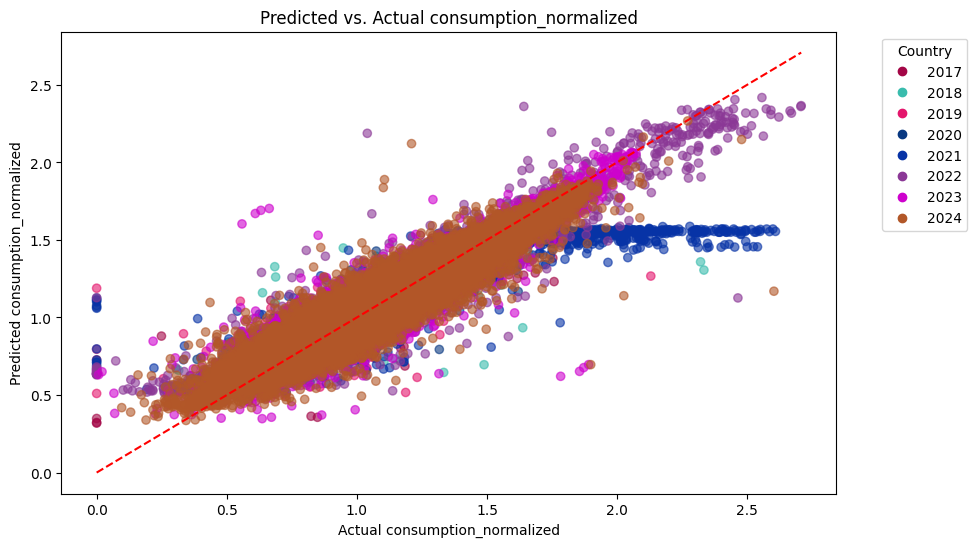

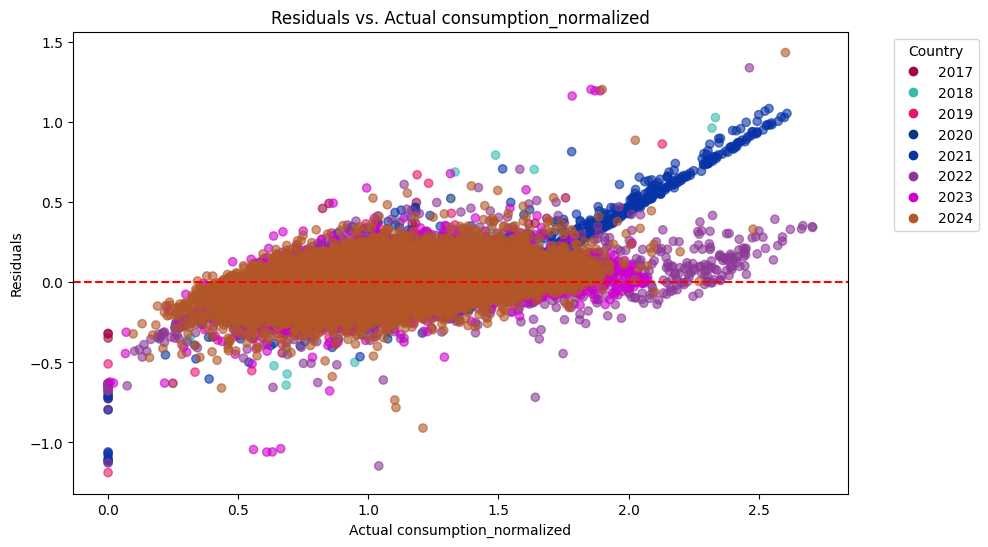

In [20]:
result = evaluate_predictions_country(
    predictions=filtered_data_new['Prrediction'],
    true_values=filtered_data_new['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data_new['Year']  # Use the Country column
)

Test - consumption_normalized Metrics:
  MAE: 0.0249
  RMSE: 0.0361
  R²: 0.9658
consumption_normalized Range: Min = 0.0, Max = 2.707224507656984, Range = 2.707224507656984
MAE as percentage of range: 0.92%
RMSE as percentage of range: 1.33%


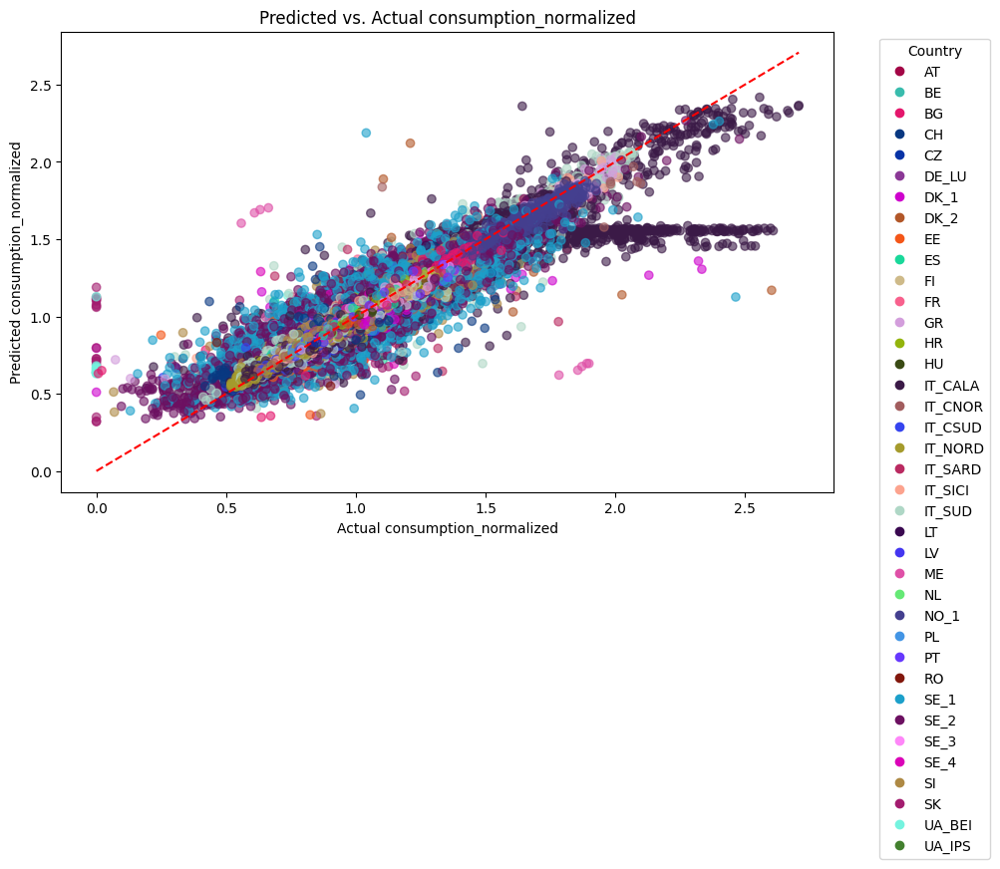

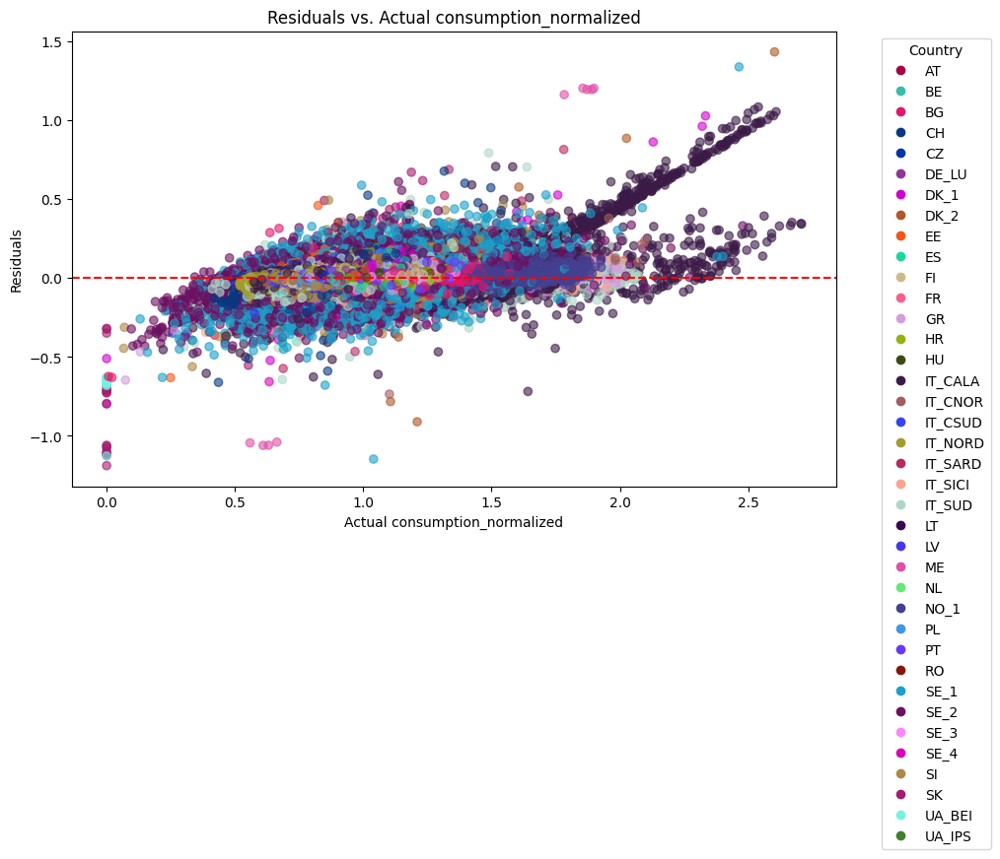

In [22]:
result = evaluate_predictions_country(
    predictions=filtered_data_new['Prrediction'],
    true_values=filtered_data_new['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data_new['Country']  # Use the Country column
)

In [38]:
filtered_data_new['residual'] = filtered_data_new['Prrediction'] - filtered_data_new['consumption_normalized']

# Use z-score to detect outliers (common threshold: abs(z) > 2 or 3)
mean_resid = filtered_data_new['residual'].mean()
std_resid = filtered_data_new['residual'].std()
filtered_data_new['z_score'] = (filtered_data_new['residual'] - mean_resid) / std_resid

# Define outliers as rows with z-score greater than 2 or less than -2
outliers = filtered_data_new[np.abs(filtered_data_new['z_score']) > 25]

# Show the outlier rows
outliers[['Time', 'Country', 'DayAheadPriceEUR', 'Prrediction', 'consumption_normalized', 'residual', 'ConsumptionValue']]

,Time,Country,DayAheadPriceEUR,Prrediction,consumption_normalized,residual,ConsumptionValue
218438,2018-01-17 08:00:00,DK_1,42.49,1.358293,2.320560,-0.962267,5374.0
253739,2018-03-22 08:00:00,DK_1,40.33,1.305359,2.333515,-1.028155,5404.0
449548,2019-03-04 07:00:00,SK,41.00,1.188429,0.000000,1.188429,0.0
651680,2020-01-30 22:00:00,SK,39.90,1.076613,0.000000,1.076613,0.0
977436,2021-06-14 07:00:00,SK,75.80,1.065932,0.000000,1.065932,0.0
983547,2021-06-23 09:00:00,SK,99.64,1.124416,0.000000,1.124416,0.0
986928,2021-06-28 10:00:00,SK,123.00,1.100326,0.000000,1.100326,0.0
992360,2021-07-06 12:00:00,SK,89.99,1.113174,0.000000,1.113174,0.0
996908,2021-07-13 07:00:00,SK,106.00,1.111359,0.000000,1.111359,0.0
1016562,2021-08-11 13:00:00,SK,82.96,1.059311,0.000000,1.059311,0.0


In [35]:
outliers.columns

Index(['Unnamed: 0', 'Time', 'ConsumptionValue', 'DayAheadPriceEUR',
       'WeatherWindSpeed', 'WeatherTemperature', 'Year', 'Day', 'Hour',
       'WeatherTemperature_F',
       ...
       'block_6.0:tempbin', 'block_6.0:tempbin2', 'block_6.0:Solar_MWh',
       'Lag1_Consumption', 'Lag24_Consumption', 'Lag168_Consumption',
       'Prrediction', 'Residuals', 'residual', 'z_score'],
      dtype='object', length=283)

In [24]:
importance_df_new = pd.read_csv('new_model_importance_df.csv')

In [25]:
important_features = importance_df_new[importance_df_new['Mean Importance'] > 0.0004]['Feature'].tolist()
important_features

['Lag1_Consumption',
 'Lag168_Consumption',
 'Lag24_Consumption',
 'HourOfWeek_8',
 'block_1.0:tempbin2',
 'HourOfWeek_149',
 'block_2.0:tempbin',
 'block_2.0:tempbin2',
 'block_6.0:tempbin2',
 'HourOfWeek_126',
 'block_6.0:tempbin',
 'block_1.0:tempbin',
 'block_4.0:tempbin',
 'HourOfWeek_11',
 'HourOfWeek_10',
 'HourOfWeek_127',
 'block_1.0:Solar_MWh',
 'HourOfWeek_4',
 'HourOfWeek_7',
 'block_5.0:tempbin',
 'HourOfWeek_28',
 'Month_1',
 'Month_2',
 'HourOfWeek_76',
 'HourOfWeek_52',
 'HourOfWeek_9',
 'HourOfWeek_6',
 'HourOfWeek_100',
 'HourOfWeek_17',
 'HourOfWeek_148',
 'HourOfWeek_125',
 'HourOfWeek_5',
 'HourOfWeek_140',
 'HourOfWeek_29',
 'HourOfWeek_116',
 'HourOfWeek_77',
 'HourOfWeek_68',
 'HourOfWeek_92',
 'HourOfWeek_44',
 'HourOfWeek_128',
 'HourOfWeek_101',
 'HourOfWeek_53',
 'HourOfWeek_30',
 'HourOfWeek_139',
 'HourOfWeek_16',
 'block_5.0:tempbin2',
 'HourOfWeek_15',
 'HourOfWeek_54',
 'HourOfWeek_18',
 'block_3.0:tempbin',
 'HourOfWeek_161',
 'HourOfWeek_132',
 'HourO


Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 397533 | Test samples: 209691
Best L Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.02, 'max_depth': 5, 'n_estimators': 400, 'subsample': 0.8}
Best R Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300, 'reg_alpha': 0.1, 'reg_lambda': 0.3, 'subsample': 0.7}
Best M Parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 400, 'subsample': 0.9}


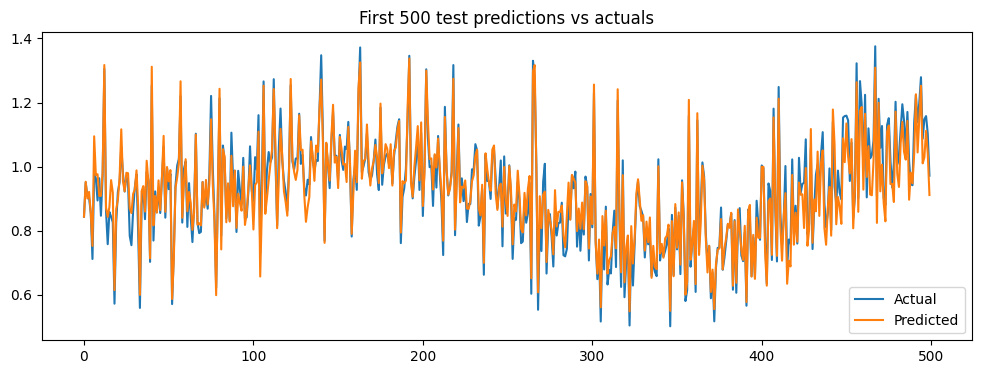

Test error l: 0.9722570742677111
Test error r: 0.3107335111479377
Test error m: 0.2195471789352853

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 411612 | Test samples: 202944


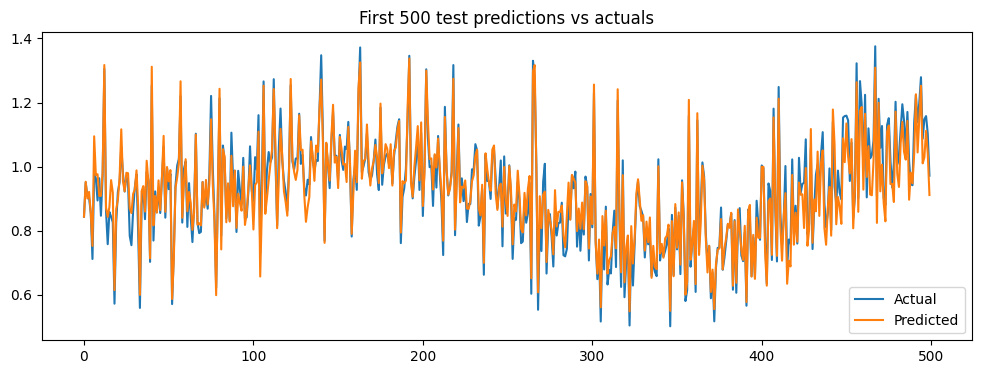

Test error l: 0.969998264054878
Test error r: -0.09023184036791743
Test error m: 0.21739479789712568

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 412635 | Test samples: 220672


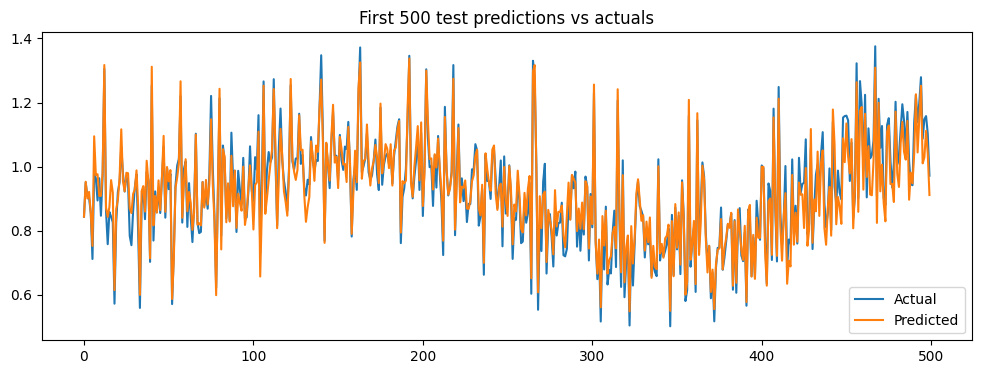

Test error l: 0.9725574300664723
Test error r: 0.3198514019594202
Test error m: 0.21979223881418897

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 423616 | Test samples: 234271


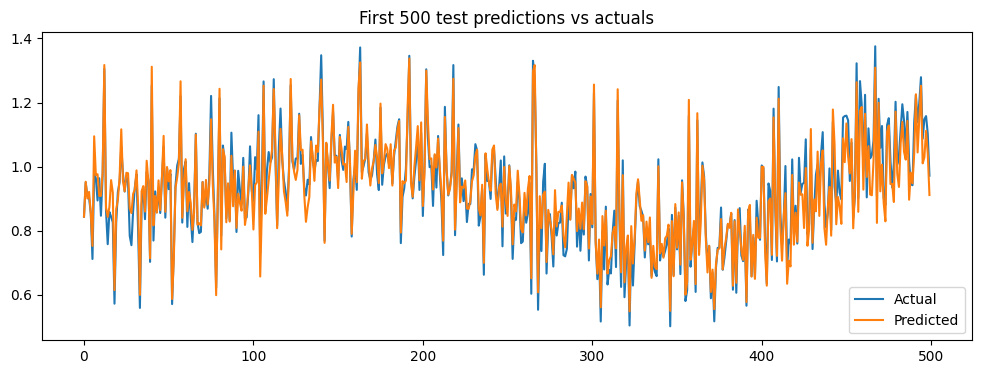

Test error l: 0.975946438452137
Test error r: 0.18781312769884562
Test error m: 0.438110224239176

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 454943 | Test samples: 250886


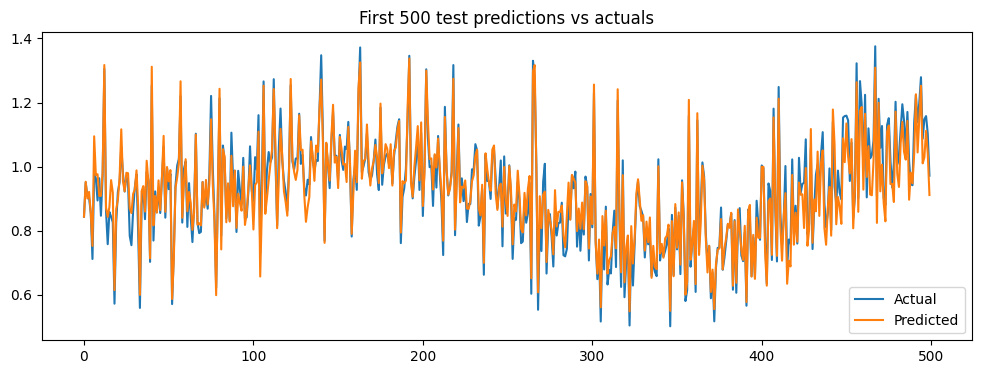

Test error l: 0.958895095270135
Test error r: -0.4704355461260137
Test error m: -1.9246061239653613

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 485157 | Test samples: 282483


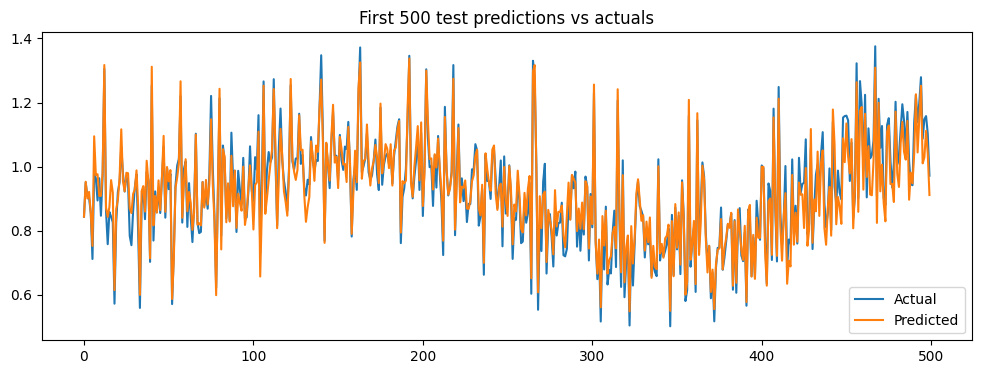

Test error l: 0.9625246922499527
Test error r: 0.5742435627067002
Test error m: 0.18411016092536303

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 533369 | Test samples: 289183


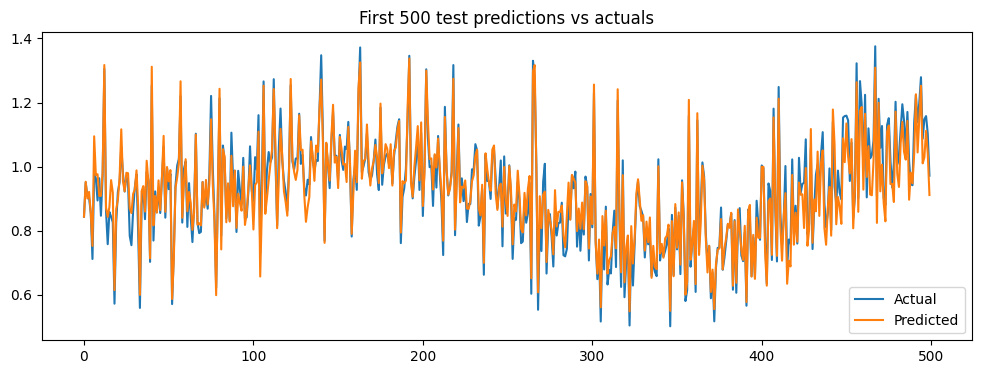

Test error l: 0.9606610712506523
Test error r: 0.19213045481120672
Test error m: 0.2637465215474559

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 571666 | Test samples: 303356


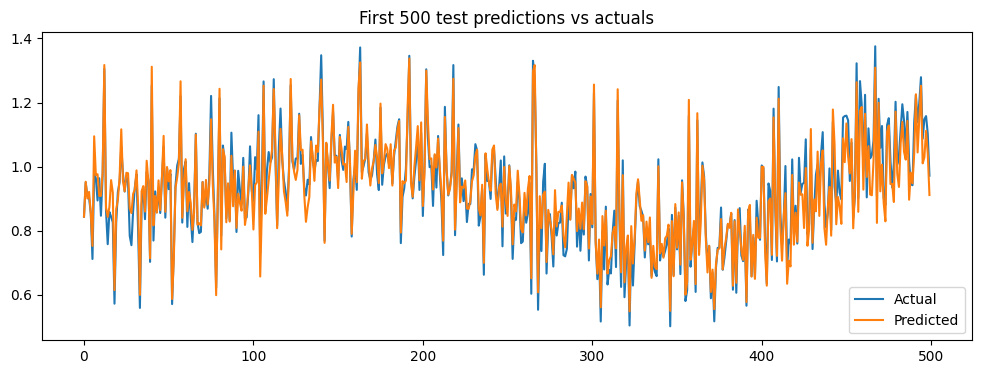

Test error l: 0.9615981173327911
Test error r: 0.3626885472564152
Test error m: 0.2856247237285632
Overall Train Metrics:
MAE: 0.023506535401805813, RMSE: 0.03288360068685896, R²: 0.9705054919085815
Overall Test Metrics:
MAE: 0.024891486981139695, RMSE: 0.036007646597331584, R²: 0.9658809403528306
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_normalized
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['Lag1_Consumption', 'Lag168_Consumption', 'Lag24_Consumption', 'HourOfWeek_8', 'block_1.0:tempbin2', 'HourOfWeek_149', 'block_2.0:tempbin', 'block_2.0:tempbin2', 'block_6.0:tempbin2', 'HourOfWeek_126', 'block_6.0:tempbin', 'block_1.0:tempbin', 'block_4.0:tempbin', 'HourOfWeek_11', 'HourOfWeek_10', 'HourOfWeek_127', 'block_1.0:Solar_MWh', 'HourOfWeek_4', 'HourOfWeek_7', 'block_5.0:tempbin', 'HourOfWeek_28', 'Month_1', 'Month_2', 'HourOfWeek_76', 'HourO

In [47]:
dml_pliv_import, filtered_data_import, importance_df_import, fold_metrics_df_import, importance_all_folds_df_import, fold_coefficients_import = dml_rolling_window(processed_data_new, 
                                                                                                                             important_features, 
                                                                                                                             dependent_variable = 'consumption_normalized',
                                                                                                                             param_dist_xgb=param_dist_xgb,
                                                                                                                             param_dist_xgb_r=param_dist_xgb_r,
                                                                                                                             param_dist_xgb_m=param_dist_xgb_m)
          

In [48]:
processed_data_new

,Unnamed: 0,Time,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Day,Hour,WeatherTemperature_F,...,block_4.0:Solar_MWh,block_5.0:tempbin,block_5.0:tempbin2,block_5.0:Solar_MWh,block_6.0:tempbin,block_6.0:tempbin2,block_6.0:Solar_MWh,Lag1_Consumption,Lag24_Consumption,Lag168_Consumption
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
2962.0,4760.0,2015-01-08 01:00:00,5708.00,52.53,7.403433,272.641998,2015,8.0,1.0,31.085597,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.009633,0.928435,0.899191
2959.0,4757.0,2015-01-08 01:00:00,1259.00,24.57,14.878457,276.439911,2015,8.0,1.0,37.921840,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.858153,0.856139,0.876283
2954.0,4752.0,2015-01-08 01:00:00,7485.00,14.19,6.053447,268.911804,2015,8.0,1.0,24.371248,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.041964,1.019469,0.822254
2953.0,4751.0,2015-01-08 01:00:00,7423.00,41.09,4.584281,272.279388,2015,8.0,1.0,30.432899,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.056919,1.058470,1.078765
2951.0,4749.0,2015-01-08 01:00:00,2019.00,16.11,16.933323,277.227112,2015,8.0,1.0,39.338801,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.895767,0.839505,0.795204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2024-12-31 23:00:00,4545.00,138.70,3.535453,283.701355,2024,31.0,23.0,50.992439,...,0.0,0.0,0.0,0.0,4.0,2.600229,0.0,0.835920,0.799190,0.753407
NaN,NaN,2024-12-31 23:00:00,1971.50,125.31,2.739260,277.086395,2024,31.0,23.0,39.085511,...,0.0,0.0,0.0,0.0,2.0,1.527677,0.0,1.011109,0.945543,0.913480
NaN,NaN,2024-12-31 23:00:00,5002.25,147.25,2.887089,269.677643,2024,31.0,23.0,25.749757,...,0.0,0.0,0.0,0.0,1.0,0.663050,0.0,1.061121,0.999447,0.853262


# One lag

In [17]:
def prepare_data_with_dummies_and_interactions(
    data,
    base_covariates=None,
    include_interactions=None,
    dependent_variable='consumption_normalized',
    include_lags=True
):
    data = data.copy()
    data = data[data["PriceArea"] != "DE_AT_LU"]
    data['Time'] = pd.to_datetime(data['Time'])
    data['Year'] = data['Time'].dt.year
    data = data.sort_values(by='Time')
    data['Country'] = data['PriceArea']
    data['consumption_normalized'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', data['Time'].dt.year])['ConsumptionValue'].transform('mean')
    )
    data['consumption_norm_peak'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', 'Year'])['ConsumptionValue'].transform('max')
    )

    data['Total_Wind_Generation'] = (
        data['Wind_Offshore'].fillna(0) + data['Wind_Onshore'].fillna(0)
    )

    # Dummies
    data = pd.get_dummies(data, columns=['block'], drop_first=False)
    data = pd.get_dummies(data, columns=['PriceArea'], drop_first=False)
    price_area_columns = [col for col in data.columns if col.startswith('PriceArea_')]
    for col in price_area_columns:
        data[col] = data[col].astype(int)

    data['HourOfWeek'] = data['Time'].dt.dayofweek * 24 + data['Time'].dt.hour
    data = pd.get_dummies(data, columns=['HourOfWeek'], drop_first=False)

    data['Month'] = data['Time'].dt.month
    data = pd.get_dummies(data, columns=['Month'], drop_first=False)

    # Rolling features
    data['RollingMean24h'] = (
        data.groupby(['Country', 'Year'])['ConsumptionValue']
        .transform(lambda x: x.rolling(window=24, min_periods=12).mean())
    )
    data['Lag1_Price'] = data.groupby('Country')['DayAheadPriceEUR'].shift(1)
    data['RollingStd24_LaggedPrice'] = data.groupby(['Country', 'Year'])['Lag1_Price'].transform(
        lambda x: x.rolling(window=24, min_periods=12).std()
    )
    price_threshold = data['Lag1_Price'].quantile(0.95)
    data['LaggedPriceSpike'] = (data['Lag1_Price'] > price_threshold).astype(int)


    # Step 2: Add interaction terms if specified
    interaction_covariates = []
    block_dummy_columns = [col for col in data.columns if col.startswith('block_')]

    if include_interactions:
        for block_col in block_dummy_columns:
            if 'block' in include_interactions:
                for interaction_col in include_interactions['block']:
                    interaction_term = f'{block_col}:{interaction_col}'
                    data[interaction_term] = data[block_col] * data[interaction_col]
                    interaction_covariates.append(interaction_term)

        
    # Step 3: Optionally add lagged features
    lag_features = []
    if include_lags:
        data['Lag1_Consumption'] = data.groupby('Country')[dependent_variable].shift(1)
        lag_features = ['Lag1_Consumption']

    # Step 4: Define covariates
    if base_covariates is None:
        base_covariates = []
        
    all_features = base_covariates + lag_features

    for feat in all_features:
        if feat not in base_covariates:
            base_covariates.append(feat)

    covariates = list(set(base_covariates + interaction_covariates +
                          [col for col in data.columns if col.startswith('PriceArea_')] +
                          [col for col in data.columns if col.startswith('HourOfWeek_')] +
                          [col for col in data.columns if col.startswith('Month_')]))

    covariates = [col for col in covariates if not (col.startswith('block_') and ':' not in col)]

    endogenous_variable = 'DayAheadPriceEUR'
    instrument_variables = ['Total_Wind_Generation']

    key_variables = [dependent_variable, endogenous_variable] + instrument_variables + covariates
    filtered_processed_data = data.dropna(subset=key_variables)

    return filtered_processed_data, covariates

In [18]:
processed_data_new, covariates_new = prepare_data_with_dummies_and_interactions(
    data_1,
    base_covariates=['Price_gas', 'Price_coal', 'Price_EUA'],
    include_interactions={'block': ['tempbin', 'tempbin2', 'Solar_MWh']},
    dependent_variable = 'consumption_normalized'
)
processed_data_new = processed_data_new[processed_data_new['Time'].dt.year != 2025]
processed_data_new

,Unnamed: 0,Time,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Day,Hour,WeatherTemperature_F,...,block_4.0:tempbin,block_4.0:tempbin2,block_4.0:Solar_MWh,block_5.0:tempbin,block_5.0:tempbin2,block_5.0:Solar_MWh,block_6.0:tempbin,block_6.0:tempbin2,block_6.0:Solar_MWh,Lag1_Consumption
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
21.0,28.0,2015-01-01 02:00:00,5879.00,20.27,5.878027,271.040405,2015,1.0,2.0,28.202729,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.822254
19.0,20.0,2015-01-01 02:00:00,21286.00,42.27,6.516034,278.325043,2015,1.0,2.0,41.315077,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.801737
18.0,23.0,2015-01-01 02:00:00,1745.00,14.60,11.060371,278.674744,2015,1.0,2.0,41.944539,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.795204
17.0,22.0,2015-01-01 02:00:00,1236.00,14.60,10.920368,277.208038,2015,1.0,2.0,39.304469,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.876283
20.0,26.0,2015-01-01 02:00:00,7397.00,35.47,3.526751,268.095337,2015,1.0,2.0,22.901606,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.078765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2024-12-31 23:00:00,4545.00,138.70,3.535453,283.701355,2024,31.0,23.0,50.992439,...,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.600229,0.0,0.835920
NaN,NaN,2024-12-31 23:00:00,1971.50,125.31,2.739260,277.086395,2024,31.0,23.0,39.085511,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.527677,0.0,1.011109
NaN,NaN,2024-12-31 23:00:00,5002.25,147.25,2.887089,269.677643,2024,31.0,23.0,25.749757,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.663050,0.0,1.061121


In [32]:
manual_params_l = {
    'colsample_bytree': 0.8,
    'learning_rate': 0.02,
    'max_depth': 5,
    'n_estimators': 400,
    'subsample': 0.8
}

manual_params_r = {
    'colsample_bytree': 0.8,
    'learning_rate': 0.01,
    'max_depth': 3,
    'n_estimators': 300,
    'reg_alpha': 0.1,
    'reg_lambda': 0.3,
    'subsample': 0.7
}

manual_params_m = {
    'colsample_bytree': 0.9,
    'learning_rate': 0.01,
    'max_depth': 4,
    'n_estimators': 400,
    'subsample': 0.9
}



Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401794 | Test samples: 209955


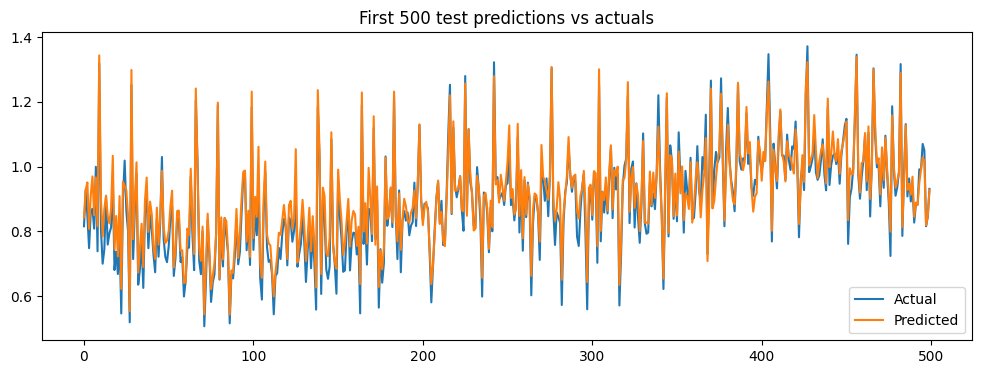

Test error l: 0.9653527303989429
Test error r: 0.23606443992501258
Test error m: 0.5585294888746647

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412296 | Test samples: 203208


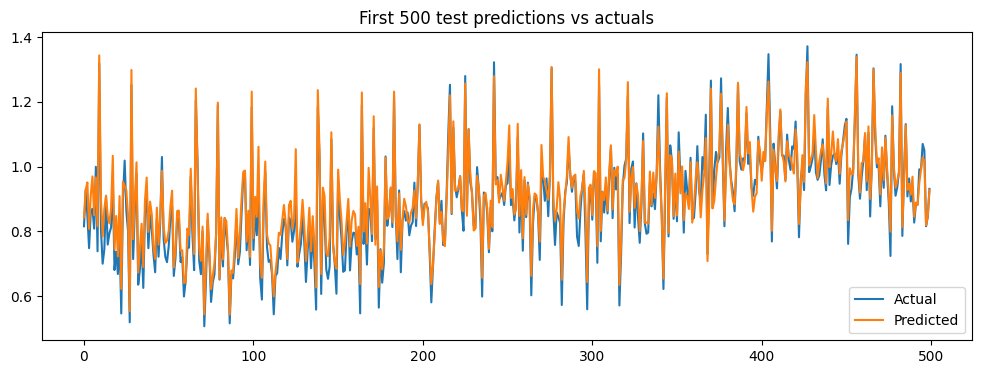

Test error l: 0.9618865437513308
Test error r: -0.011715271498206503
Test error m: 0.5888173786328135

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413163 | Test samples: 221270


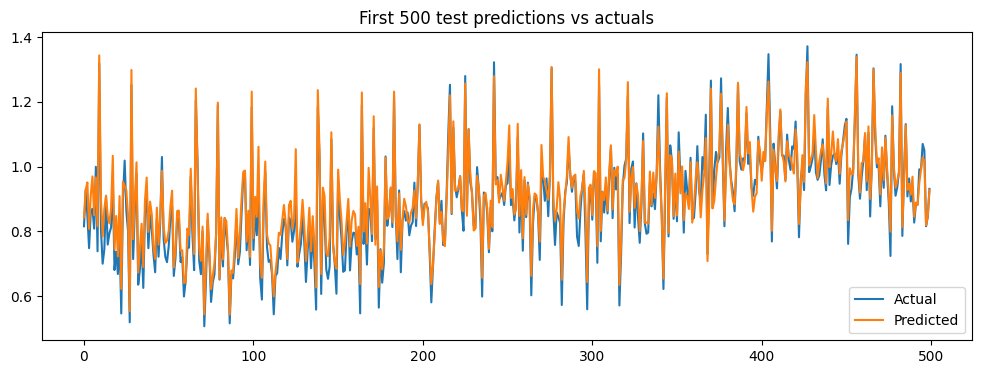

Test error l: 0.9660035062371372
Test error r: 0.25971896651093973
Test error m: 0.45644856499177366

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424478 | Test samples: 234724


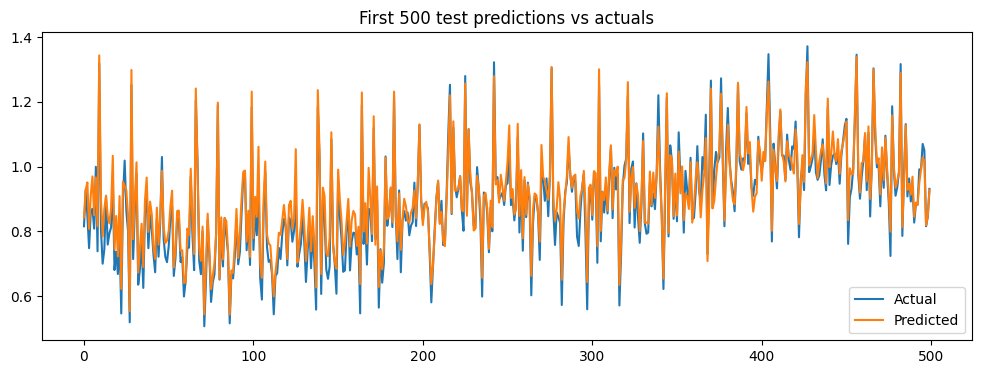

Test error l: 0.9689843499633508
Test error r: 0.14761265916749033
Test error m: 0.6022198827006577

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455994 | Test samples: 252358


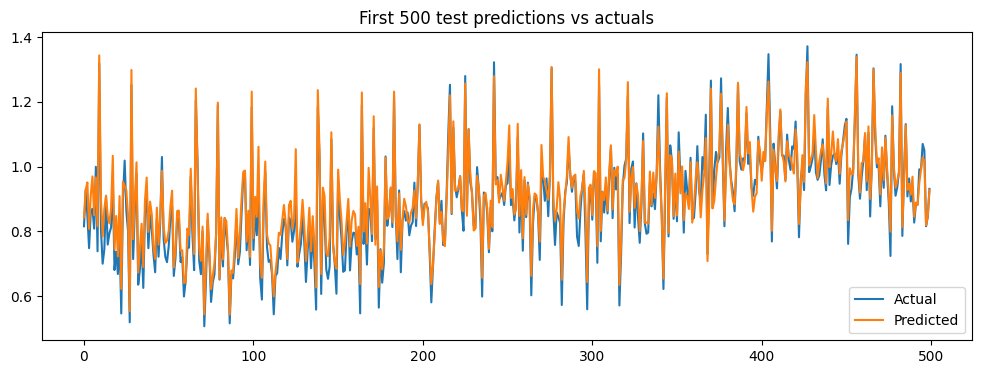

Test error l: 0.95184753682884
Test error r: -0.6061031846247789
Test error m: 0.3621828613902751

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 487082 | Test samples: 282858


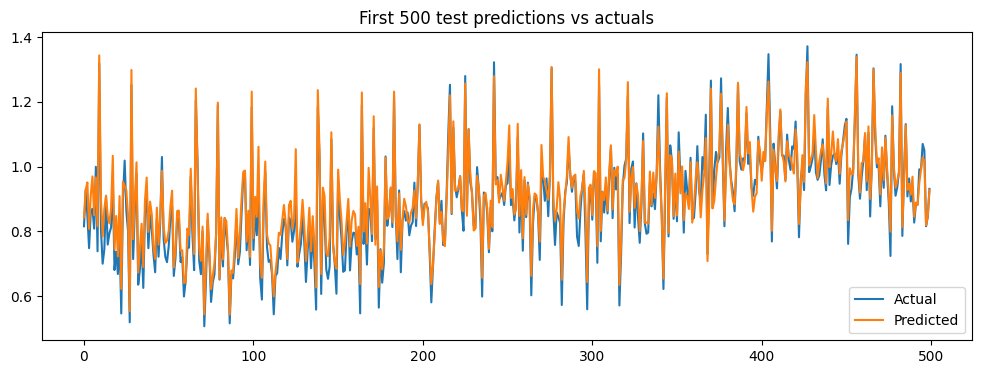

Test error l: 0.953557345338072
Test error r: 0.30719028036312435
Test error m: 0.6429555596131293

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 535216 | Test samples: 289869


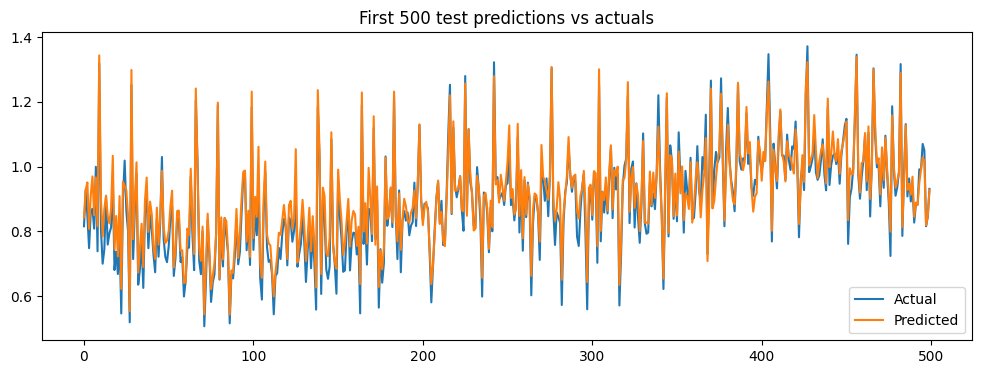

Test error l: 0.9556618029190963
Test error r: 0.2234509085660471
Test error m: 0.574789392755151

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 572727 | Test samples: 304063


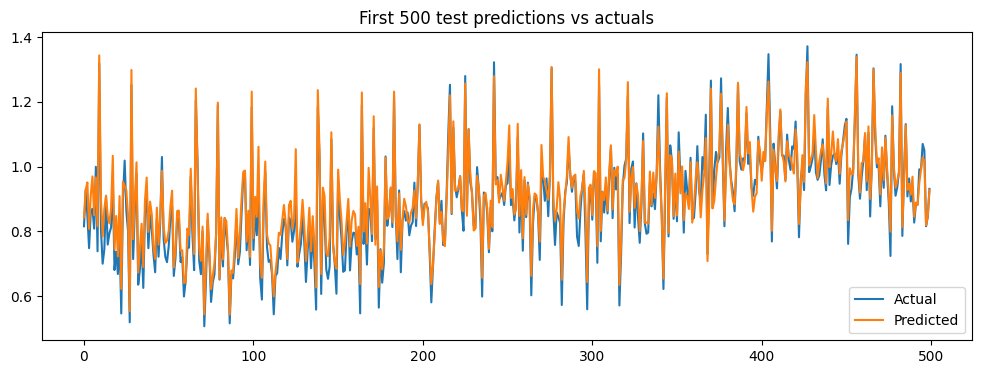

Test error l: 0.958002450468875
Test error r: 0.15169158199707344
Test error m: 0.6201565646800883
Overall Train Metrics:
MAE: 0.026119817068357053, RMSE: 0.036282202914590694, R²: 0.9641291991488019
Overall Test Metrics:
MAE: 0.027721378310246427, RMSE: 0.03928217469535933, R²: 0.9594251173405794
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_normalized
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['HourOfWeek_81', 'HourOfWeek_120', 'HourOfWeek_48', 'block_6.0:Solar_MWh', 'HourOfWeek_57', 'HourOfWeek_30', 'block_5.0:tempbin2', 'HourOfWeek_144', 'PriceArea_LV', 'block_1.0:tempbin', 'Month_6', 'HourOfWeek_156', 'PriceArea_CZ', 'HourOfWeek_56', 'PriceArea_HU', 'Month_2', 'HourOfWeek_108', 'HourOfWeek_35', 'HourOfWeek_29', 'HourOfWeek_61', 'PriceArea_IT_SICI', 'HourOfWeek_26', 'HourOfWeek_64', 'HourOfWeek_128', 'PriceArea_FI', 'HourOfWeek_143', 'Hou

In [26]:
dml_pliv_import, filtered_data_import, importance_df_import, fold_metrics_df_import, importance_all_folds_df_import, fold_coefficients_import = dml_rolling_window(processed_data_new, 
                                                                                                                             covariates_new, 
                                                                                                                             dependent_variable = 'consumption_normalized',
                                                                                                                             manual_params_l=manual_params_l,
                                                                                                                             manual_params_r=manual_params_r,
                                                                                                                             manual_params_m=manual_params_m)
          

In [27]:
filtered_data_import.to_csv("model_lag_consumtion_df.csv", index=False)
importance_df_import.to_csv("model_lag_consumtion_importance.csv", index=False)
fold_coefficients_import = pd.DataFrame(fold_coefficients_import)
fold_coefficients_import.to_csv("model_lag_consumtion_fold_coef.csv", index=False)

Test - consumption_normalized Metrics:
  MAE: 0.0277
  RMSE: 0.0393
  R²: 0.9594
consumption_normalized Range: Min = 0.0, Max = 2.749327903946239, Range = 2.749327903946239
MAE as percentage of range: 1.01%
RMSE as percentage of range: 1.43%


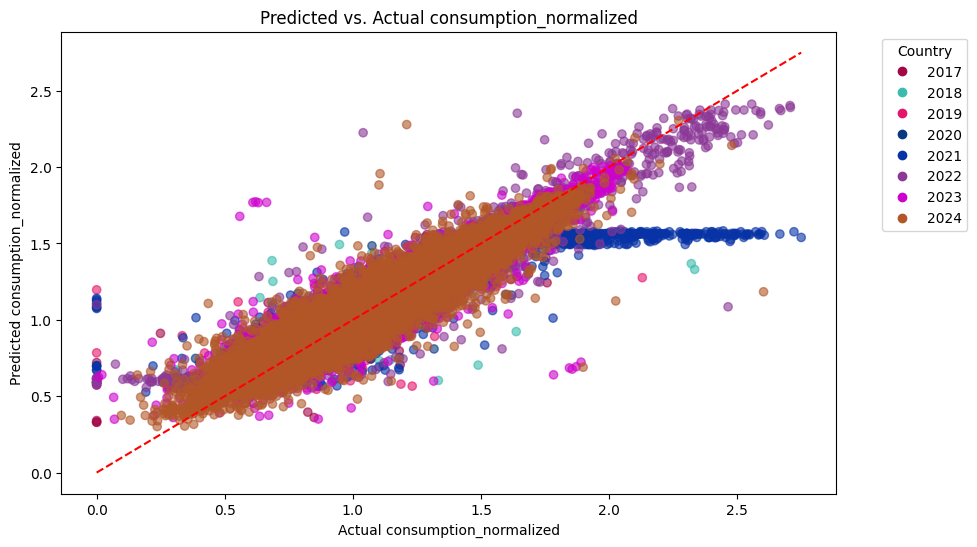

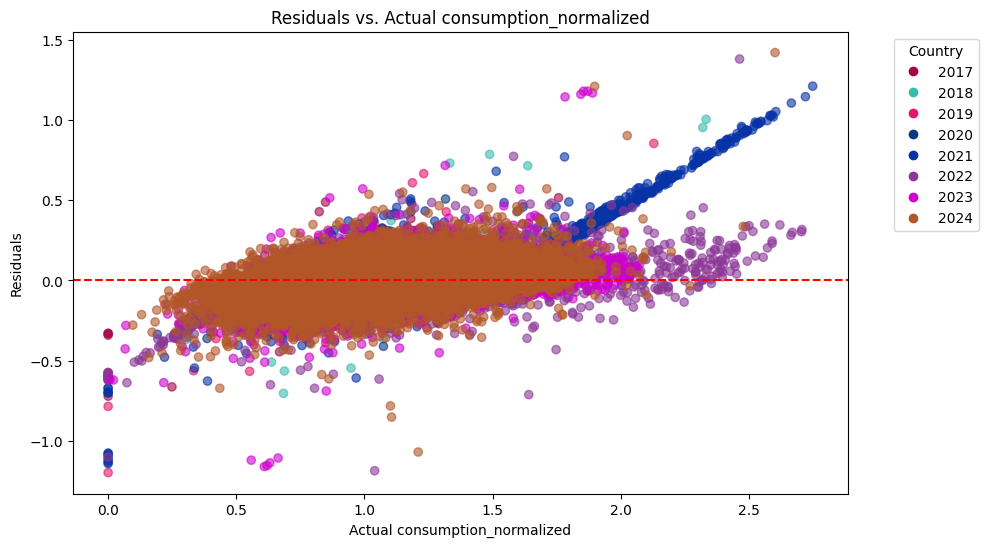

In [34]:
result = evaluate_predictions_country(
    predictions=filtered_data_import['Prrediction'],
    true_values=filtered_data_import['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data_import['Year']  # Use the Country column
)

In [28]:
top_50_features = importance_df_import.sort_values(
    by='Mean Importance', ascending=False
).head(50)['Feature'].tolist()
top_50_features

['Lag1_Consumption',
 'block_6.0:tempbin',
 'block_1.0:tempbin2',
 'block_6.0:tempbin2',
 'block_1.0:tempbin',
 'Month_1',
 'HourOfWeek_149',
 'Month_2',
 'HourOfWeek_150',
 'block_2.0:tempbin',
 'Month_5',
 'block_2.0:tempbin2',
 'Month_12',
 'block_3.0:tempbin2',
 'block_4.0:tempbin',
 'block_1.0:Solar_MWh',
 'block_4.0:tempbin2',
 'PriceArea_FR',
 'HourOfWeek_52',
 'Price_EUA',
 'HourOfWeek_100',
 'HourOfWeek_76',
 'HourOfWeek_28',
 'HourOfWeek_148',
 'Price_gas',
 'HourOfWeek_140',
 'Price_coal',
 'HourOfWeek_164',
 'HourOfWeek_147',
 'HourOfWeek_125',
 'HourOfWeek_4',
 'HourOfWeek_156',
 'block_5.0:tempbin',
 'HourOfWeek_116',
 'block_4.0:Solar_MWh',
 'block_3.0:Solar_MWh',
 'block_5.0:tempbin2',
 'HourOfWeek_20',
 'HourOfWeek_29',
 'HourOfWeek_53',
 'HourOfWeek_77',
 'HourOfWeek_5',
 'HourOfWeek_44',
 'HourOfWeek_92',
 'block_3.0:tempbin',
 'HourOfWeek_68',
 'HourOfWeek_101',
 'HourOfWeek_6',
 'HourOfWeek_65',
 'Month_4']


Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401794 | Test samples: 209955


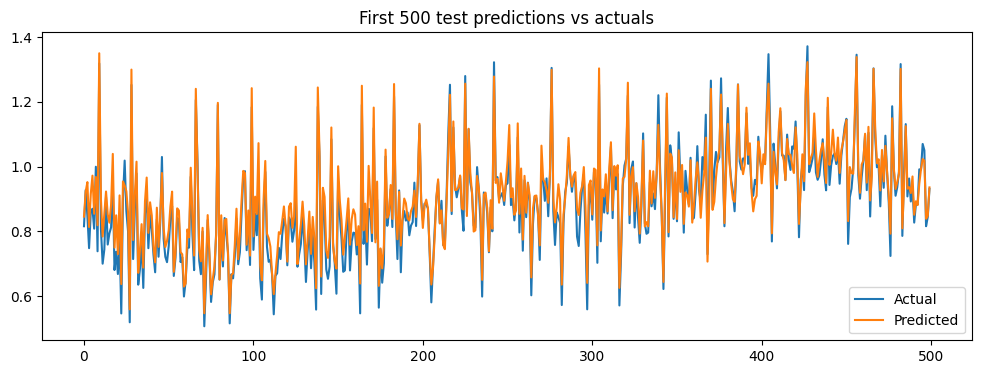

Test error l: 0.9620836544315825
Test error r: 0.19638694398341672
Test error m: 0.14112107551195108

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412296 | Test samples: 203208


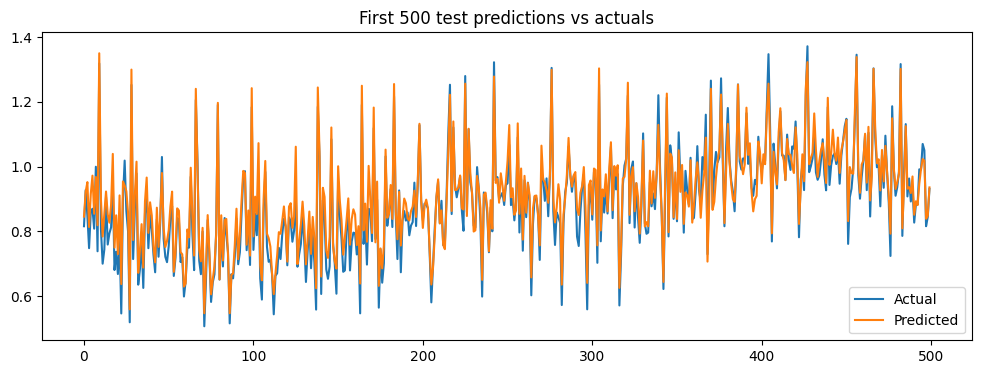

Test error l: 0.959563839512468
Test error r: -0.20926909734206078
Test error m: -0.031570521324299605

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413163 | Test samples: 221270


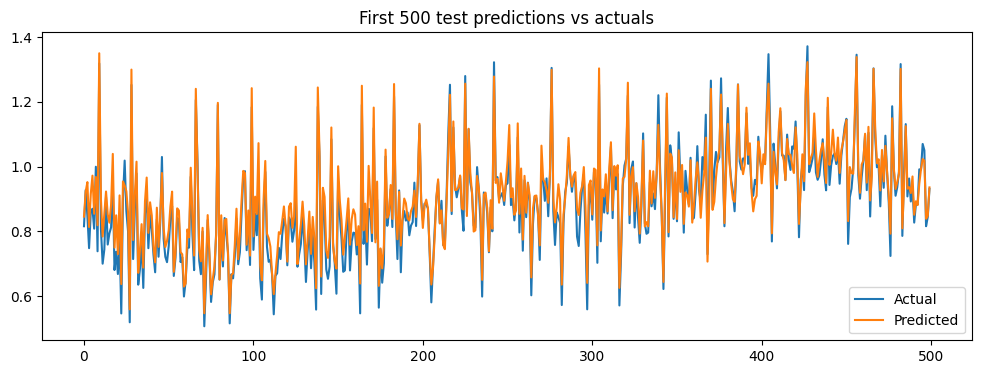

Test error l: 0.9631888676427025
Test error r: 0.2270475483881801
Test error m: 0.13705367026299753

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424478 | Test samples: 234724


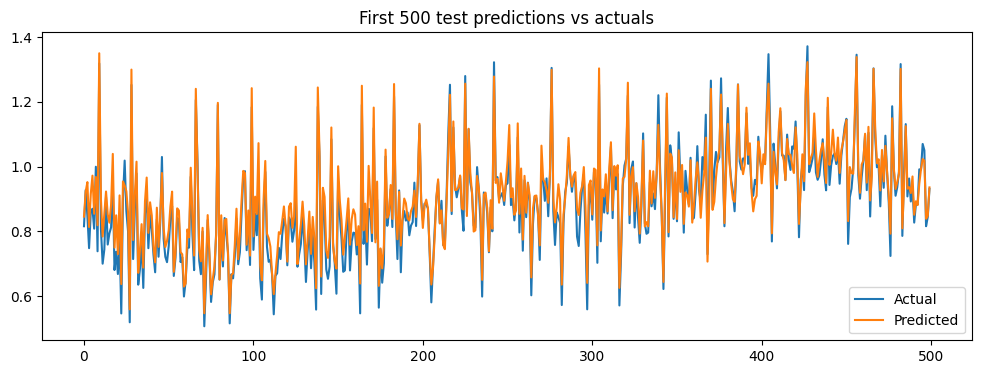

Test error l: 0.9663069791206279
Test error r: 0.1554144289022794
Test error m: 0.3815531027327058

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455994 | Test samples: 252358


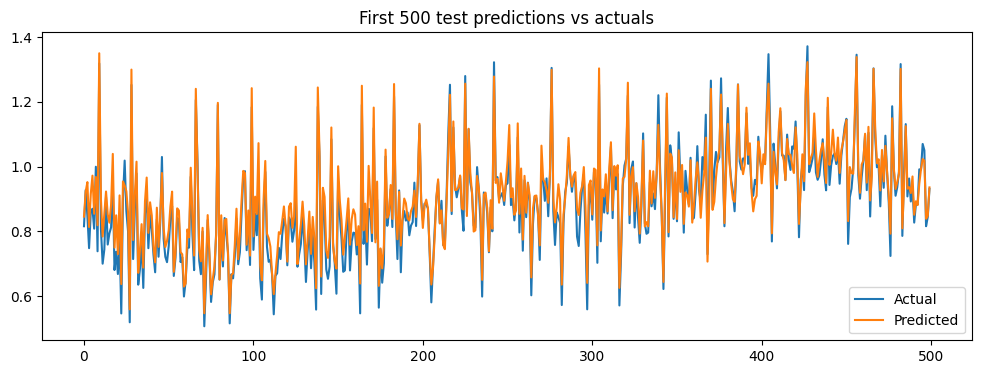

Test error l: 0.9485838378693262
Test error r: -0.6278505902021954
Test error m: -2.8100123662651444

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 487082 | Test samples: 282858


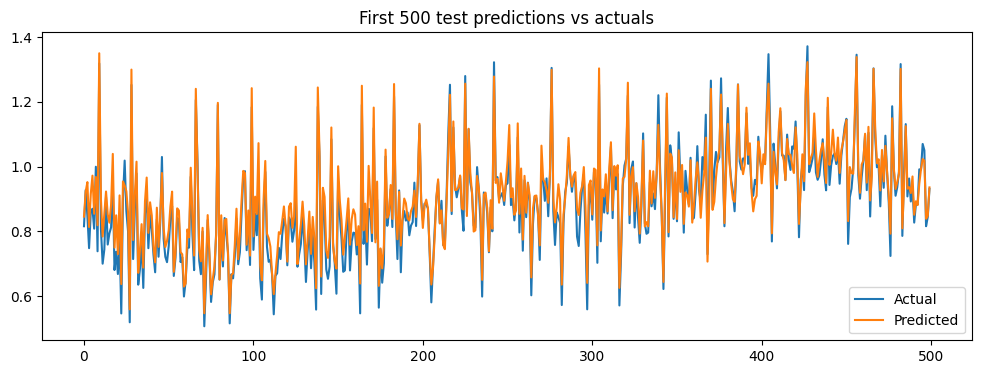

Test error l: 0.9504145736805607
Test error r: 0.23932703340480255
Test error m: 0.10909665018287906

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 535216 | Test samples: 289869


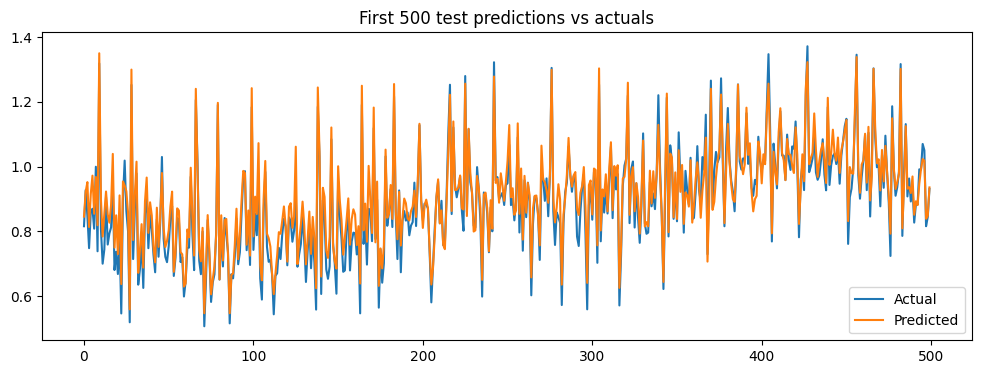

Test error l: 0.9536533581778345
Test error r: 0.11763453395149381
Test error m: 0.14192760591191567

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 572727 | Test samples: 304063


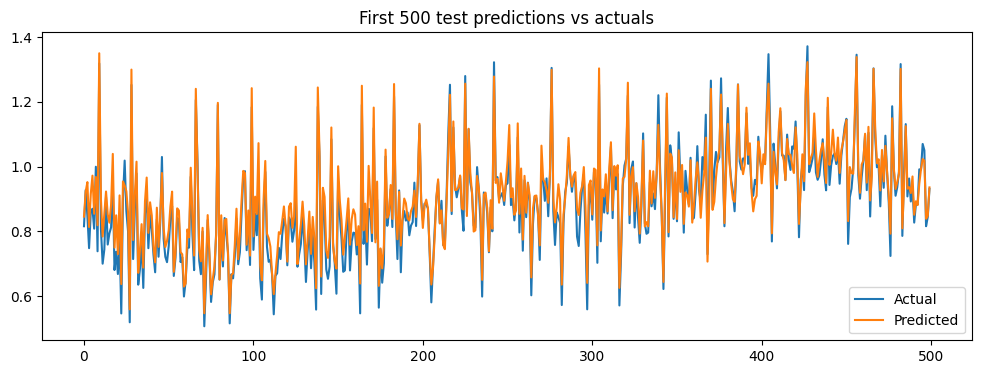

Test error l: 0.9559809807018962
Test error r: 0.11988704174738796
Test error m: 0.14334123525160314
Overall Train Metrics:
MAE: 0.026953538742911544, RMSE: 0.03755150429470014, R²: 0.9615754795803503
Overall Test Metrics:
MAE: 0.02856312456846302, RMSE: 0.040540602458942275, R²: 0.9567837953217422
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_normalized
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['Lag1_Consumption', 'block_6.0:tempbin', 'block_1.0:tempbin2', 'block_6.0:tempbin2', 'block_1.0:tempbin', 'Month_1', 'HourOfWeek_149', 'Month_2', 'HourOfWeek_150', 'block_2.0:tempbin', 'Month_5', 'block_2.0:tempbin2', 'Month_12', 'block_3.0:tempbin2', 'block_4.0:tempbin', 'block_1.0:Solar_MWh', 'block_4.0:tempbin2', 'PriceArea_FR', 'HourOfWeek_52', 'Price_EUA', 'HourOfWeek_100', 'HourOfWeek_76', 'HourOfWeek_28', 'HourOfWeek_148', 'Price_gas', 'HourOf

In [29]:
dml_pliv_import_1, filtered_data_import_1, importance_df_import_1, fold_metrics_df_import_1, importance_all_folds_df_import_1, fold_coefficients_import_1 = dml_rolling_window(processed_data_new, 
                                                                                                                             top_50_features, 
                                                                                                                             dependent_variable = 'consumption_normalized',
                                                                                                                             manual_params_l=manual_params_l,
                                                                                                                             manual_params_r=manual_params_r,
                                                                                                                             manual_params_m=manual_params_m)
          

In [31]:
covariates_regression = [var for var in covariates_new if var not in ['HourOfWeek_0', 'Month_1']]

In [33]:
outcome_var = 'consumption_normalized'
treatment_var = ['DayAheadPriceEUR']
instrument_vars = ['Total_Wind_Generation']
cluster_var = 'Country'

# Prepare matrices
Y = filtered_data_import[outcome_var]
D = filtered_data_import[treatment_var]
Z = filtered_data_import[instrument_vars]
W = filtered_data_import[covariates_regression]

# Fit the IV model
iv_model_check_filter = IV2SLS(dependent=Y, exog=W, endog=D, instruments=Z).fit(cov_type='clustered', clusters=filtered_data_import[cluster_var])

# Summary of results
print(iv_model_check_filter.summary)

                            IV-2SLS Estimation Summary                            
Dep. Variable:     consumption_normalized   R-squared:                      0.9633
Estimator:                        IV-2SLS   Adj. R-squared:                 0.9633
No. Observations:                 1998305   F-statistic:                 9.502e+18
Date:                    Tue, Apr 22 2025   P-value (F-stat)                0.0000
Time:                            11:37:18   Distribution:                chi2(239)
Cov. Estimator:                 clustered                                         
                                                                                  
                                  Parameter Estimates                                  
                     Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
---------------------------------------------------------------------------------------
HourOfWeek_81           0.0346     0.0040     8.5956     0.0000      0.0

In [16]:
def prepare_data_log_transform(
    data,
    base_covariates=None,
    include_interactions=None,
    dependent_variable='consumption_normalized',
    apply_log_transform = True 
):
    data = data.copy()
    data = data[data["PriceArea"] != "DE_AT_LU"]
    data['Time'] = pd.to_datetime(data['Time'])
    data['Year'] = data['Time'].dt.year
    data = data.sort_values(by='Time')
    data['Country'] = data['PriceArea']
    data['consumption_normalized'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', data['Time'].dt.year])['ConsumptionValue'].transform('mean')
    )
    data['consumption_norm_peak'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', 'Year'])['ConsumptionValue'].transform('max')
    )

    data['Total_Wind_Generation'] = (
        data['Wind_Offshore'].fillna(0) + data['Wind_Onshore'].fillna(0)
    )


    # Rolling features
    data['RollingMean24h'] = (
        data.groupby(['Country', 'Year'])['ConsumptionValue']
        .transform(lambda x: x.rolling(window=24, min_periods=12).mean())
    )
    data['Lag1_Price'] = data.groupby('Country')['DayAheadPriceEUR'].shift(1)
    data['RollingStd24_LaggedPrice'] = data.groupby(['Country', 'Year'])['Lag1_Price'].transform(
        lambda x: x.rolling(window=24, min_periods=12).std()
    )
    price_threshold = data['Lag1_Price'].quantile(0.95)
    data['LaggedPriceSpike'] = (data['Lag1_Price'] > price_threshold).astype(int)
    
    if apply_log_transform:
        log_vars = [
            'consumption_normalized', 'DayAheadPriceEUR',
            'Total_Wind_Generation', 
            'Price_gas', 'Price_coal', 'Price_EUA', 'Solar_MWh'
        ]
        epsilon = 1e-3

        # Apply log transformation
        data['log_consumption'] = np.log(data['consumption_normalized'].clip(lower=epsilon))
        data['log_DayAheadPriceEUR'] = np.log(data['DayAheadPriceEUR'].clip(lower=epsilon))
        data['log_Total_Wind_Generation'] = np.log(data['Total_Wind_Generation'].clip(lower=epsilon))
        data['log_Price_gas'] = np.log(data['Price_gas'].clip(lower=epsilon))
        data['log_Price_coal'] = np.log(data['Price_coal'].clip(lower=epsilon))
        data['log_Price_EUA'] = np.log(data['Price_EUA'].clip(lower=epsilon))
        data['log_Solar_MWh'] = np.log(data['Solar_MWh'].clip(lower=epsilon))

        # Update base_covariates and include_interactions
        if base_covariates:
            base_covariates = [f"log_{var}" if var in log_vars else var for var in base_covariates]
        if include_interactions:
            for k, v in include_interactions.items():
                include_interactions[k] = [f"log_{x}" if x in log_vars else x for x in v]


    data = pd.get_dummies(data, columns=['block'], drop_first=False)
    data = pd.get_dummies(data, columns=['PriceArea'], drop_first=False)
    price_area_columns = [col for col in data.columns if col.startswith('PriceArea_')]
    for col in price_area_columns:
        data[col] = data[col].astype(int)

    data['HourOfWeek'] = data['Time'].dt.dayofweek * 24 + data['Time'].dt.hour
    data = pd.get_dummies(data, columns=['HourOfWeek'], drop_first=False)
    data['Month'] = data['Time'].dt.month
    data = pd.get_dummies(data, columns=['Month'], drop_first=False)

    # Interactions
    interaction_covariates = []
    block_dummy_columns = [col for col in data.columns if col.startswith('block_')]
    if include_interactions:
        for block_col in block_dummy_columns:
            if 'block' in include_interactions:
                for interaction_col in include_interactions['block']:
                    interaction_term = f'{block_col}:{interaction_col}'
                    data[interaction_term] = data[block_col] * data[interaction_col]
                    interaction_covariates.append(interaction_term)

    data['Lag1_Consumption'] = data.groupby('Country')['consumption_normalized'].shift(1)         
    data['log_Lag1_Consumption'] = np.log(data['Lag1_Consumption'].clip(lower=epsilon))
    lag_features = ['log_Lag1_Consumption']
    base_covariates = base_covariates + lag_features


    # Covariates
    covariates = list(set(base_covariates + interaction_covariates +
                          [col for col in data.columns if col.startswith('PriceArea_')] +
                          [col for col in data.columns if col.startswith('HourOfWeek_')] +
                          [col for col in data.columns if col.startswith('Month_')]))

    covariates = [col for col in covariates if not (col.startswith('block_') and ':' not in col)]

    if apply_log_transform:
        dependent_variable = 'log_consumption'
        endogenous_variable = ['log_DayAheadPriceEUR']
        instrument_variables = ['log_Total_Wind_Generation']
    else:
        endogenous_variable = ['DayAheadPriceEUR']
        instrument_variables = ['Total_Wind_Generation']

    key_variables = [dependent_variable] + endogenous_variable + instrument_variables + covariates
    filtered_processed_data = data.dropna(subset=key_variables)

    return filtered_processed_data, covariates

In [17]:
processed_data_new, covariates_new = prepare_data_log_transform(
    data_1,
    base_covariates=['Price_gas', 'Price_coal', 'Price_EUA'],
    include_interactions={'block': ['tempbin', 'tempbin2', 'Solar_MWh']},
    dependent_variable = 'consumption_normalized'
)
processed_data_new = processed_data_new[processed_data_new['Time'].dt.year != 2025]
processed_data_new

,Unnamed: 0,Time,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Day,Hour,WeatherTemperature_F,...,block_4.0:tempbin2,block_4.0:log_Solar_MWh,block_5.0:tempbin,block_5.0:tempbin2,block_5.0:log_Solar_MWh,block_6.0:tempbin,block_6.0:tempbin2,block_6.0:log_Solar_MWh,Lag1_Consumption,log_Lag1_Consumption
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
21.0,28.0,2015-01-01 02:00:00,5879.00,20.27,5.878027,271.040405,2015,1.0,2.0,28.202729,...,0.0,-0.0,0.0,0.0,-0.0,0.0,0.000000,-0.000000,0.822254,-0.195705
19.0,20.0,2015-01-01 02:00:00,21286.00,42.27,6.516034,278.325043,2015,1.0,2.0,41.315077,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.801737,-0.220975
18.0,23.0,2015-01-01 02:00:00,1745.00,14.60,11.060371,278.674744,2015,1.0,2.0,41.944539,...,0.0,-0.0,0.0,0.0,-0.0,0.0,0.000000,-0.000000,0.795204,-0.229157
17.0,22.0,2015-01-01 02:00:00,1236.00,14.60,10.920368,277.208038,2015,1.0,2.0,39.304469,...,0.0,-0.0,0.0,0.0,-0.0,0.0,0.000000,-0.000000,0.876283,-0.132066
20.0,26.0,2015-01-01 02:00:00,7397.00,35.47,3.526751,268.095337,2015,1.0,2.0,22.901606,...,0.0,-0.0,0.0,0.0,-0.0,0.0,0.000000,-0.000000,1.078765,0.075817
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2024-12-31 23:00:00,4545.00,138.70,3.535453,283.701355,2024,31.0,23.0,50.992439,...,0.0,-0.0,0.0,0.0,-0.0,4.0,2.600229,-6.907755,0.835920,-0.179222
NaN,NaN,2024-12-31 23:00:00,1971.50,125.31,2.739260,277.086395,2024,31.0,23.0,39.085511,...,0.0,-0.0,0.0,0.0,-0.0,2.0,1.527677,-6.907755,1.011109,0.011048
NaN,NaN,2024-12-31 23:00:00,5002.25,147.25,2.887089,269.677643,2024,31.0,23.0,25.749757,...,0.0,-0.0,0.0,0.0,-0.0,1.0,0.663050,-6.907755,1.061121,0.059326


In [19]:
def dml_rolling_window_log(filtered_data, base_covariates, manual_params_l=None, manual_params_r = None, manual_params_m=None, param_dist_xgb=None, param_dist_xgb_r=None, param_dist_xgb_m=None, dependent_variable = 'consumption_normalized'):
    
    data = filtered_data.copy()
    
    covariates = base_covariates.copy()
    

    # Initialize lists to collect predictions and time indices
    predictions_ml_l = []
    predictions_ml_r = []
    predictions_ml_m = []
    time_indices = []
    train_predictions = []
    train_actuals = []
    test_predictions = []
    test_actuals = []
    feature_importances_per_window = []
    fold_metrics = []
    test_years = []
    fold_feature_importance_df = []
    fold_coefficients = []
    train_predictions_r = []
    test_predictions_r = []
    train_actuals_r = []
    test_actuals_r = []

    train_predictions_m = []
    test_predictions_m = []
    train_actuals_m = []
    test_actuals_m = []


    

    train_test_pairs = [
    (2015, 2016, 2017),
    (2016, 2017, 2018),
    (2017, 2018, 2019),
    (2018, 2019, 2020),
    (2019, 2020, 2021),
    (2020, 2021, 2022),
    (2021, 2022, 2023),
    (2022, 2023, 2024)]
    
    
    def tune_xgb_model(X, y, param_dist_xgb):
        tscv = TimeSeriesSplit(n_splits=3)
        model = xgb.XGBRegressor(objective="reg:squarederror", tree_method="hist", eval_metric="rmse")
        grid_search = GridSearchCV(model, param_dist_xgb, cv=tscv, n_jobs=-1)
        grid_search.fit(X, y)
        return grid_search.best_params_
        
    best_params_xgb = None  # Store best params from first window
    best_params_xgb_treat = None
    best_params_xgb_inst = None
    lasso_param = None
    
    data['Year'] = data['Time'].dt.year
    year_to_indices = data.groupby('Year').indices

    
    
    for train_start, train_end, test_year in train_test_pairs:
        train_indices = []
        for y in range(train_start, train_end + 1):
            if y in year_to_indices:
                train_indices.extend(year_to_indices[y])

        test_indices = year_to_indices.get(test_year, [])

        if len(train_indices) == 0 or len(test_indices) == 0:
            print(f"Skipping test year {test_year} due to insufficient data.")
            continue
        
        train_data = data.iloc[train_indices]
        test_data = data.iloc[test_indices]



        print(f"\nTest Year: {test_year} | Training Years: {train_start} to {train_end}")
        print(f"Train samples: {len(train_indices)} | Test samples: {len(test_indices)}")


        X_train = train_data[covariates]
        y_train_ml_l = train_data[dependent_variable]
        d_train_ml_r = train_data['log_price_wins']
        z_train_ml_m_1 = train_data['log_Total_Wind_Generation']
        
        
        if best_params_xgb is None and manual_params_l is None:
            best_params_xgb = tune_xgb_model(X_train, y_train_ml_l, param_dist_xgb)
            print("Best L Parameters:", best_params_xgb)
        
        if best_params_xgb_treat is None and manual_params_r is None:
            best_params_xgb_treat = tune_xgb_model(X_train, d_train_ml_r, param_dist_xgb_r)
            print("Best R Parameters:", best_params_xgb_treat)
            
            
        if best_params_xgb_inst is None and manual_params_m is None:
            best_params_xgb_inst = tune_xgb_model(X_train, z_train_ml_m_1, param_dist_xgb_m)
            print("Best M Parameters:", best_params_xgb_inst)
            
        learner_l = xgb.XGBRegressor(**(manual_params_l if manual_params_l else best_params_xgb))
        learner_r = xgb.XGBRegressor(**(manual_params_r if manual_params_r else best_params_xgb_treat))
        learner_m = xgb.XGBRegressor(**(manual_params_m if manual_params_m else best_params_xgb_inst))
            # Train each model on the training set (fixed window)
        learner_l.fit(X_train, y_train_ml_l)
        learner_r.fit(X_train, d_train_ml_r)
        learner_m.fit(X_train, z_train_ml_m_1)
            
        feature_importances_per_window.append(learner_l.feature_importances_)

            # Predict on the test set (next year)
        X_test = test_data[covariates]
        y_test_ml_l = test_data[dependent_variable]
        d_test_ml_r = test_data['log_price_wins']
        z_test_ml_m_1 = test_data['log_Total_Wind_Generation']
        pred_l = learner_l.predict(X_test)
        pred_r = learner_r.predict(X_test)
        pred_m = learner_m.predict(X_test)
            
            # Predict on the train set (next year)
        train_predictions.extend(learner_l.predict(X_train))
        train_actuals.extend(y_train_ml_l)
        test_predictions.extend(learner_l.predict(X_test))
        test_actuals.extend(y_test_ml_l)

            # Append predictions and indices to the lists
        predictions_ml_l.extend(pred_l)
        predictions_ml_r.extend(pred_r)
        predictions_ml_m.extend(pred_m)

        train_predictions_r.extend(learner_r.predict(X_train))
        train_actuals_r.extend(d_train_ml_r)
        test_predictions_r.extend(learner_r.predict(X_test))
        test_actuals_r.extend(d_test_ml_r)
        
        train_predictions_m.extend(learner_m.predict(X_train))
        train_actuals_m.extend(z_train_ml_m_1)
        test_predictions_m.extend(learner_m.predict(X_test))
        test_actuals_m.extend(z_test_ml_m_1)
        
        
        
        time_indices.extend(test_data.index.tolist())
        
        plt.figure(figsize=(12, 4))
        plt.plot(test_actuals[:500], label='Actual')
        plt.plot(test_predictions[:500], label='Predicted')
        plt.title("First 500 test predictions vs actuals")
        plt.legend()
        plt.show()
        
        fold_mae = mean_absolute_error(y_test_ml_l, pred_l)
        fold_rmse = mean_squared_error(y_test_ml_l, pred_l, squared=False)
        fold_r2 = r2_score(y_test_ml_l, pred_l)
        fold_rr = r2_score(d_test_ml_r, pred_r)
        fold_rz = r2_score(z_test_ml_m_1, pred_m)
        print("Test error l:", fold_r2)
        print("Test error r:", fold_rr)
        print("Test error m:", fold_rz)
        
        fold_metrics.append({
            'Test Year': test_year,
            'MAE': fold_mae,
            'RMSE': fold_rmse,
            'R2': fold_r2
        })
        test_years.append(test_year)
        
        fold_feature_importance_df.append(pd.DataFrame({
            'Feature': covariates,
            'Importance': learner_l.feature_importances_,
            'Year': test_year
        }))
        
        dml_data_fold = dml.DoubleMLClusterData(
            test_data.reset_index(drop=True),
            y_col=dependent_variable,
            d_cols='log_price_wins',
            z_cols='log_Total_Wind_Generation',
            x_cols=covariates,
            cluster_cols=['Country']
        )
        
        dml_fold = dml.DoubleMLPLIV(dml_data_fold, dml.utils.DMLDummyRegressor(), dml.utils.DMLDummyRegressor(), dml.utils.DMLDummyRegressor())
        dml_fold.fit(external_predictions={
            'log_price_wins': {
                'ml_l': pred_l.reshape(-1, 1),
                'ml_r': pred_r.reshape(-1, 1),
                'ml_m': pred_m.reshape(-1, 1)
            }
        })
        fold_coefficients.append({
            'Year': test_year,
            'coef': dml_fold.coef,
            'se': dml_fold.se,
            't': dml_fold.t_stat,
            'p': dml_fold.pval,
        })


    # Calculate metrics for the entire model
    train_mae = mean_absolute_error(train_actuals, train_predictions)
    train_rmse = mean_squared_error(train_actuals, train_predictions, squared=False)
    train_r2 = r2_score(train_actuals, train_predictions)

    test_mae = mean_absolute_error(test_actuals, test_predictions)
    test_rmse = mean_squared_error(test_actuals, test_predictions, squared=False)
    test_r2 = r2_score(test_actuals, test_predictions)

    print("Overall Train Metrics:")
    print(f"MAE: {train_mae}, RMSE: {train_rmse}, R²: {train_r2}")

    print("Overall Test Metrics:")
    print(f"MAE: {test_mae}, RMSE: {test_rmse}, R²: {test_r2}")

    train_mae_r = mean_absolute_error(train_actuals_r, train_predictions_r)
    train_rmse_r = mean_squared_error(train_actuals_r, train_predictions_r, squared=False)
    train_r2_r = r2_score(train_actuals_r, train_predictions_r)

    test_mae_r = mean_absolute_error(test_actuals_r, test_predictions_r)
    test_rmse_r = mean_squared_error(test_actuals_r, test_predictions_r, squared=False)
    test_r2_r = r2_score(test_actuals_r, test_predictions_r)

    print("Overall Train Metrics R:")
    print(f"MAE: {train_mae_r}, RMSE: {train_rmse_r}, R²: {train_r2_r}")

    print("Overall Test Metrics R:")
    print(f"MAE: {test_mae_r}, RMSE: {test_rmse_r}, R²: {test_r2_r}")
    
    train_mae_m = mean_absolute_error(train_actuals_m, train_predictions_m)
    train_rmse_m = mean_squared_error(train_actuals_m, train_predictions_m, squared=False)
    train_r2_m = r2_score(train_actuals_m, train_predictions_m)

    test_mae_m = mean_absolute_error(test_actuals_m, test_predictions_m)
    test_rmse_m = mean_squared_error(test_actuals_m, test_predictions_m, squared=False)
    test_r2_m = r2_score(test_actuals_m, test_predictions_m)

    print("Overall Train Metrics:")
    print(f"MAE: {train_mae_m}, RMSE: {train_rmse_m}, R²: {train_r2_m}")

    print("Overall Test Metrics:")
    print(f"MAE: {test_mae_m}, RMSE: {test_rmse_m}, R²: {test_r2}")
    
    
    feature_importances_array = np.array(feature_importances_per_window)
    mean_importances = feature_importances_array.mean(axis=0)
    std_importances = feature_importances_array.std(axis=0)
    importance_df = pd.DataFrame({
        'Feature': covariates,
        'Mean Importance': mean_importances,
        'Std Importance': std_importances
    }).sort_values(by='Mean Importance', ascending=False)
    

    # Convert predictions lists to numpy arrays
    filtered_data = data.loc[data.index.isin(time_indices)].copy()
    
    #### predictins dataset? original dataset?

    predictions_ml_l = np.array(predictions_ml_l).reshape(-1, 1)
    predictions_ml_r = np.array(predictions_ml_r).reshape(-1, 1)
    predictions_ml_m = np.array(predictions_ml_m).reshape(-1, 1)


    pred_dict = {
        'log_price_wins': {
            'ml_l': predictions_ml_l,
            'ml_r': predictions_ml_r,
            'ml_m': predictions_ml_m
        }
    }

    # Initialize DoubleML data object
    obj_dml_data = dml.DoubleMLClusterData(
        filtered_data,
        y_col=dependent_variable,
        d_cols='log_price_wins',
        z_cols='log_Total_Wind_Generation',  # Use original instruments (not the lags) for DoubleML
        x_cols=covariates,
        cluster_cols=['Country']
    )
    # Use dummy regressors for DoubleML
    ml_l = dml.utils.DMLDummyRegressor()
    ml_m = dml.utils.DMLDummyRegressor()
    ml_r = dml.utils.DMLDummyRegressor()

    # Initialize and fit DoubleML with external predictions
    dml_pliv_obj = dml.DoubleMLPLIV(obj_dml_data, ml_l, ml_m, ml_r)
    dml_pliv_obj.fit(external_predictions=pred_dict)

    print(dml_pliv_obj)
    filtered_data["Prrediction"] = dml_pliv_obj.predictions["ml_l"].ravel()
    filtered_data["Residuals"] = dml_pliv_obj.predictions["ml_l"].ravel() - filtered_data[dependent_variable]
    filtered_data["Prrediction_r"] = dml_pliv_obj.predictions["ml_r"].ravel()
    filtered_data["Residuals_r"] = dml_pliv_obj.predictions["ml_r"].ravel() - filtered_data[dependent_variable]
    filtered_data["Prrediction_m"] = dml_pliv_obj.predictions["ml_m"].ravel()
    filtered_data["Residuals_m"] = dml_pliv_obj.predictions["ml_m"].ravel() - filtered_data[dependent_variable]
    importance_all_folds_df = pd.concat(fold_feature_importance_df, ignore_index=True)
    fold_metrics_df = pd.DataFrame(fold_metrics)
    
    
    
    return dml_pliv_obj, filtered_data, importance_df, fold_metrics_df, importance_all_folds_df, fold_coefficients


Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 191868 | Test samples: 107007


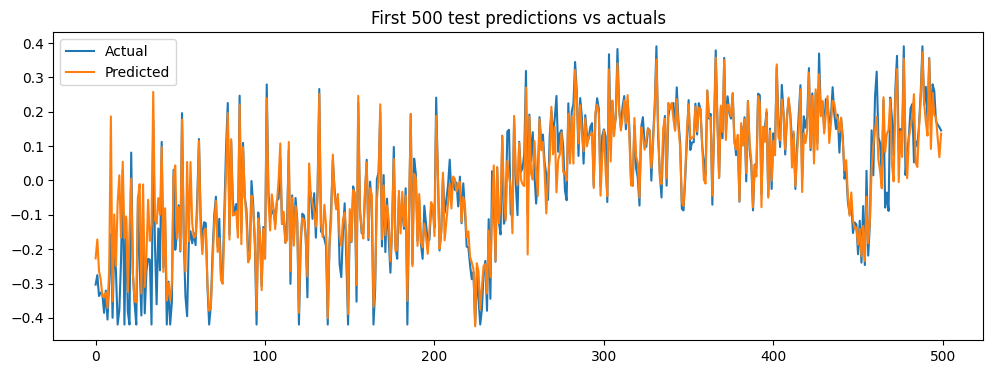

Test error l: 0.9303486542801227
Test error r: 0.0923361714390486
Test error m: 0.7116281924809532

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 207170 | Test samples: 103769


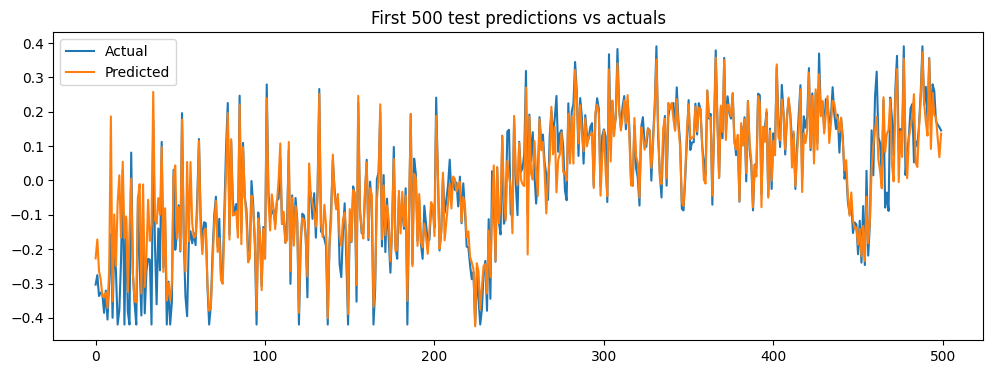

Test error l: 0.9236381169038981
Test error r: -0.5419377145555242
Test error m: 0.7103552915946081

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 210776 | Test samples: 118588


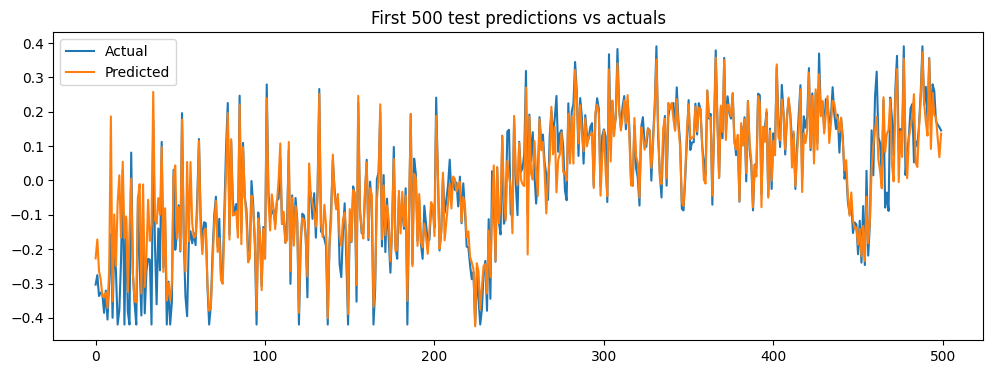

Test error l: 0.9302654323577427
Test error r: 0.030146006441266526
Test error m: 0.6727665002992169

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 222357 | Test samples: 123330


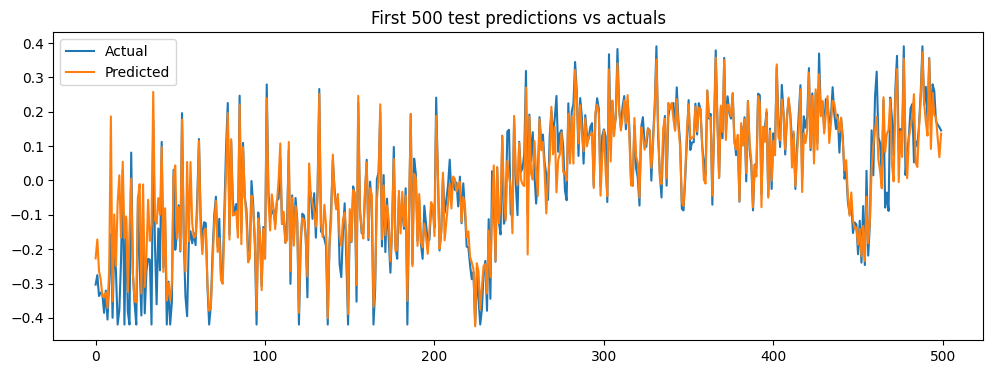

Test error l: 0.9294737612264873
Test error r: 0.15351518930904218
Test error m: 0.6561927944882169

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 241918 | Test samples: 135707


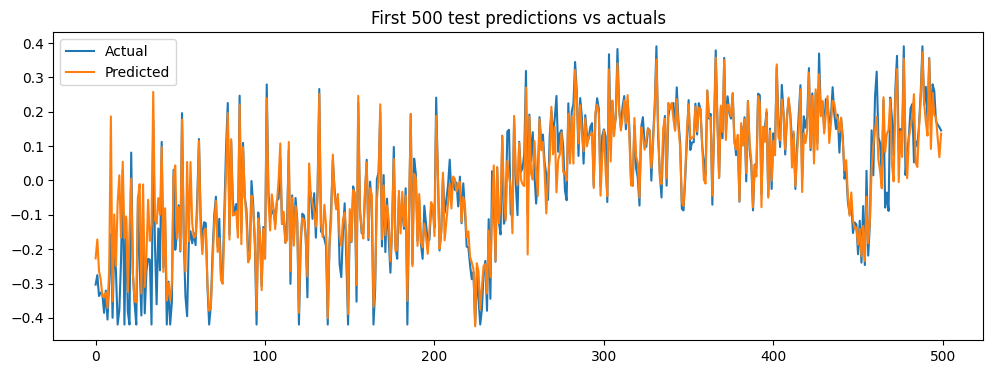

Test error l: 0.9204174421350759
Test error r: -1.431853702225954
Test error m: 0.6633075017352692

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 259037 | Test samples: 151274


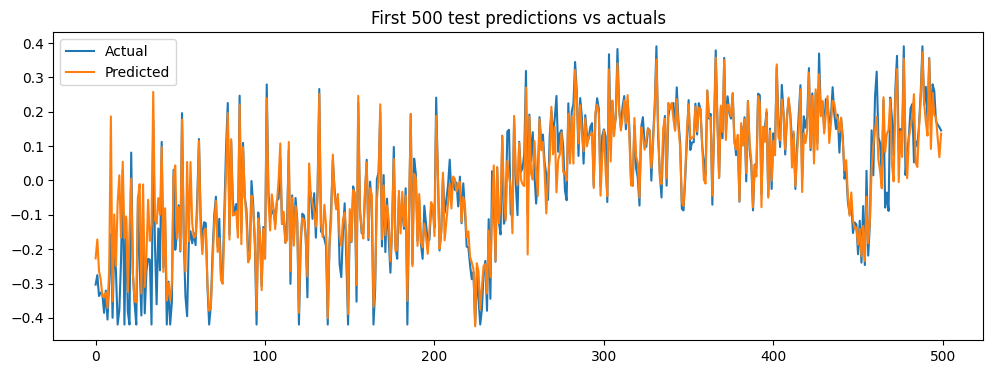

Test error l: 0.9192589627454174
Test error r: 0.026729549951343023
Test error m: 0.6312132124320518

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 286981 | Test samples: 157624


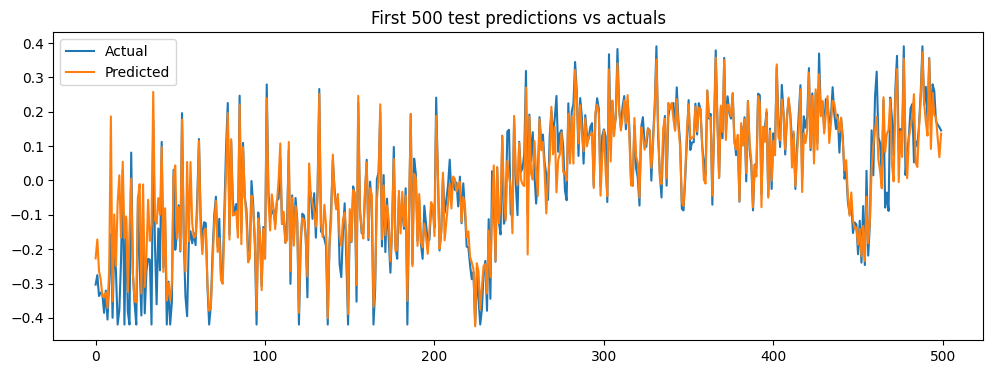

Test error l: 0.9174131263505443
Test error r: 0.12614106929382596
Test error m: 0.6348197135360768

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 308898 | Test samples: 164701


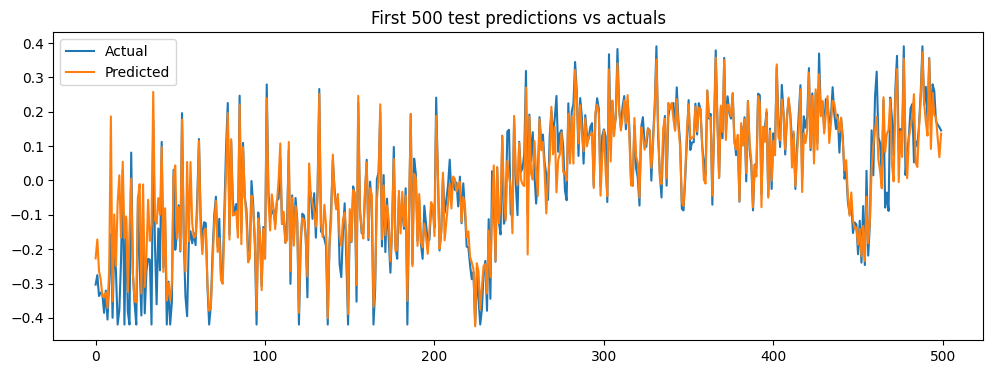

Test error l: 0.918375446281647
Test error r: 0.19828586621163669
Test error m: 0.6016160110009523
Overall Train Metrics:
MAE: 0.029905068878132393, RMSE: 0.045373892479987514, R²: 0.9298456142856393
Overall Test Metrics:
MAE: 0.03202368712050965, RMSE: 0.0483328282221799, R²: 0.9228744746777536
Overall Train Metrics R:
MAE: 0.3574980546724258, RMSE: 0.49522938004119726, R²: 0.6482069383970931
Overall Test Metrics R:
MAE: 0.5041626510498429, RMSE: 0.7308953376910492, R²: 0.3053734903420663
Overall Train Metrics:
MAE: 1.0112831082557627, RMSE: 1.256092996089559, R²: 0.7024269000496974
Overall Test Metrics:
MAE: 1.080080974896079, RMSE: 1.3408402713699685, R²: 0.9228744746777536
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: log_consumption_wins
Treatment variable(s): ['log_price_wins']
Cluster variable(s): ['Country']
Covariates: ['HourOfWeek_19', 'PriceArea_SI', 'HourOfWeek_82', 'PriceArea_HR', 'HourO

In [38]:
dml_pliv_import, filtered_data_import, importance_df_import, fold_metrics_df_import, importance_all_folds_df_import, fold_coefficients_import = dml_rolling_window_log(processed_data_new, 
                                                                                                                             covariates_new, 
                                                                                                                             dependent_variable = 'log_consumption_wins',
                                                                                                                             manual_params_l=manual_params_l,
                                                                                                                             manual_params_r=manual_params_r,
                                                                                                                             manual_params_m=manual_params_m)

In [40]:
manual_params_l = {
    'colsample_bytree': 0.8,
    'learning_rate': 0.01,       # ⬇️ smaller step due to log scale
    'max_depth': 4,              # ⬇️ slightly shallower
    'n_estimators': 600,         # ⬆️ more rounds to learn gradually
    'subsample': 0.8,
    'reg_alpha': 0.05,           # ⬆️ add light L1 regularization
    'reg_lambda': 0.3            # keep same L2
}

manual_params_r = {
    'colsample_bytree': 0.8,
    'learning_rate': 0.01,          # ⬆️ learn a bit faster
    'max_depth': 4,                 # ⬆️ allow some non-linearity
    'n_estimators': 600,
    'subsample': 0.8,
    'reg_alpha': 0.1,               # ⬇️ loosen reg to let price move
    'reg_lambda': 0.3,
    'min_child_weight': 5,          # ⬆️ prevent overfitting on small leafs
    'gamma': 1                      # ⬆️ require improvement to split
}
manual_params_m = {
    'colsample_bytree': 0.8,
    'learning_rate': 0.01,
    'max_depth': 3,
    'n_estimators': 500,
    'subsample': 0.8,
    'reg_alpha': 0.1,
    'reg_lambda': 0.4
}



Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 191868 | Test samples: 107007


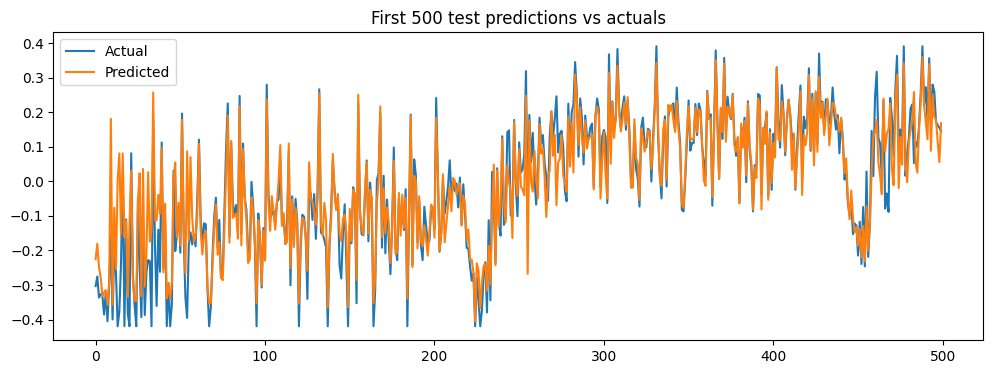

Test error l: 0.9172511096746224
Test error r: 0.20846726391463843
Test error m: 0.705178283716986

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 207170 | Test samples: 103769


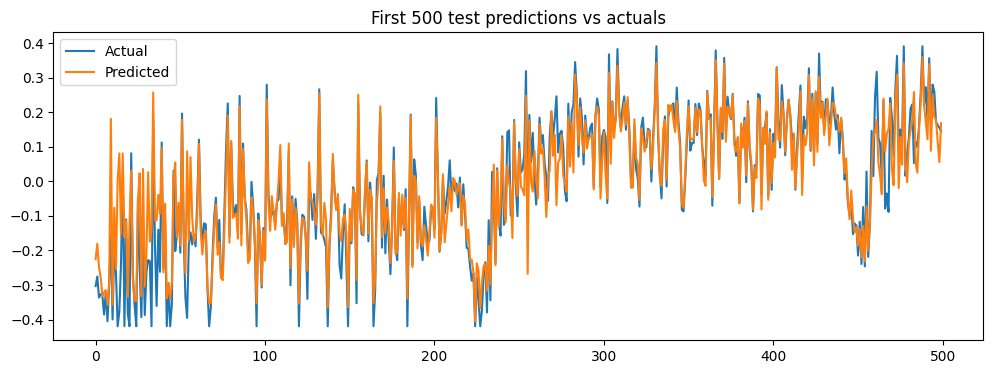

Test error l: 0.9170013120072048
Test error r: -0.306929050765121
Test error m: 0.697892697018613

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 210776 | Test samples: 118588


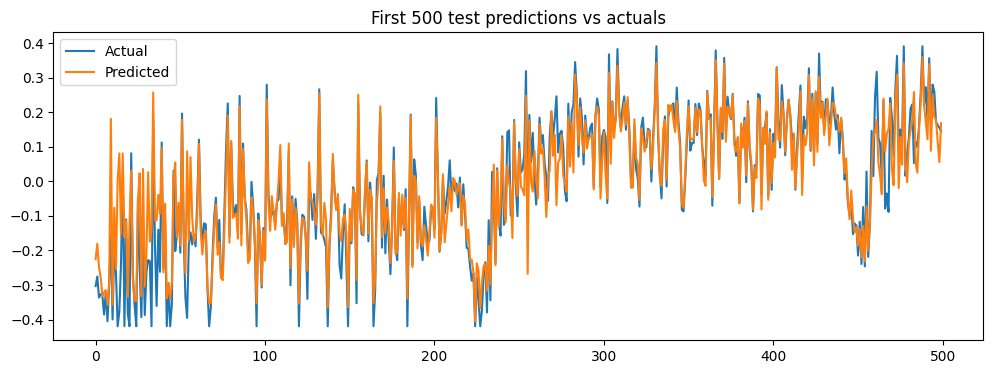

Test error l: 0.9186604210618411
Test error r: 0.12315545236125569
Test error m: 0.666639942327335

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 222357 | Test samples: 123330


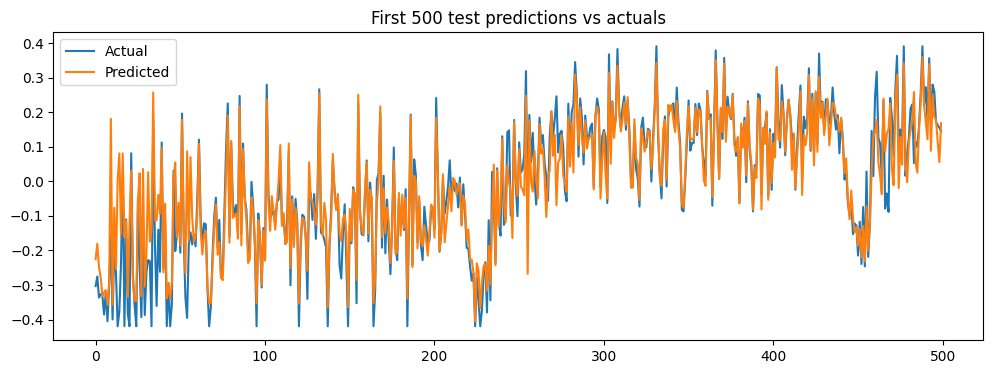

Test error l: 0.9197821505263987
Test error r: 0.0966985289618405
Test error m: 0.6468697448169902

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 241918 | Test samples: 135707


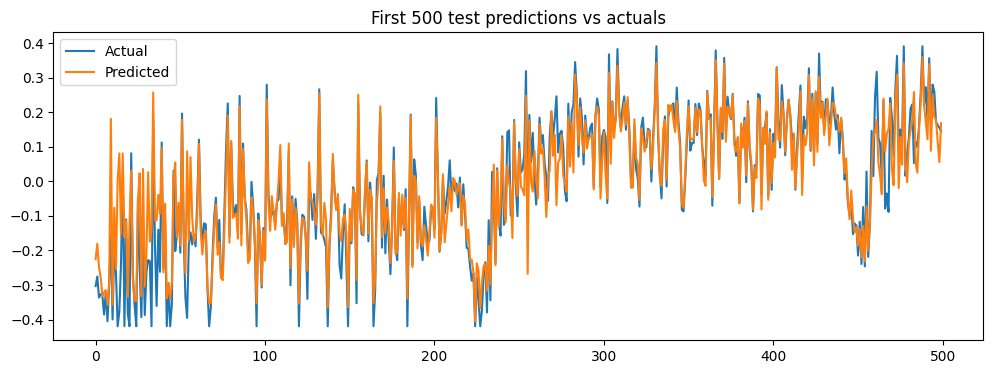

Test error l: 0.9096731154017633
Test error r: -1.3186695271636029
Test error m: 0.6516896453236072

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 259037 | Test samples: 151274


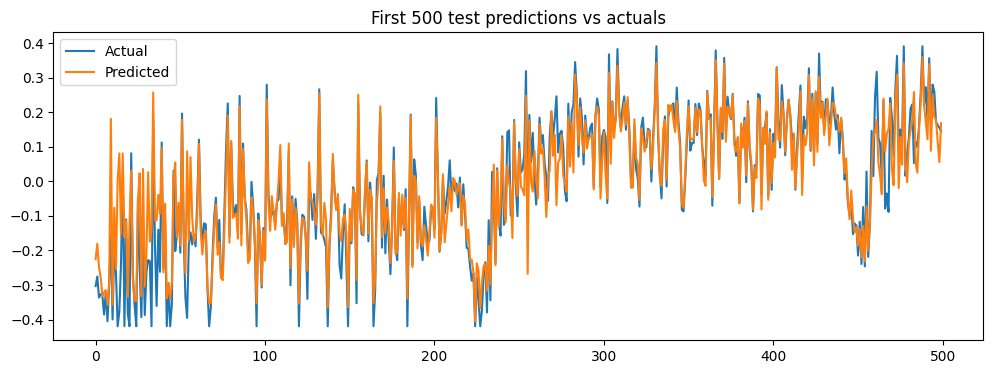

Test error l: 0.9100268129490334
Test error r: 0.07976526453304289
Test error m: 0.6208914738873019

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 286981 | Test samples: 157624


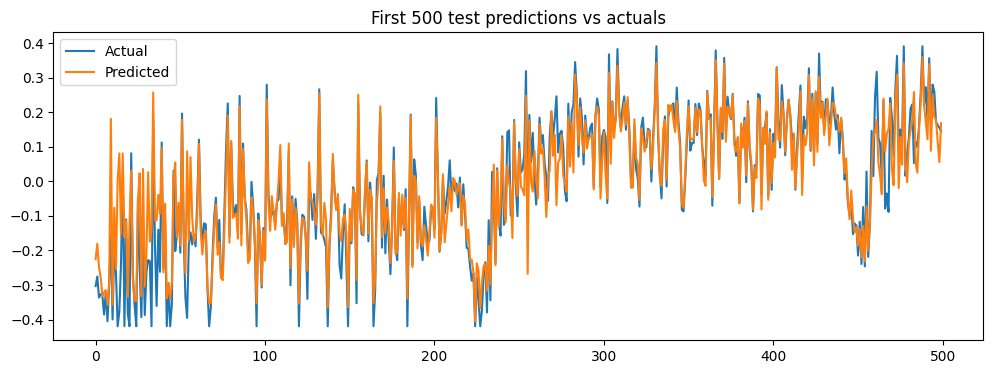

Test error l: 0.9073738162578716
Test error r: 0.1057681407858031
Test error m: 0.6262080174947067

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 308898 | Test samples: 164701


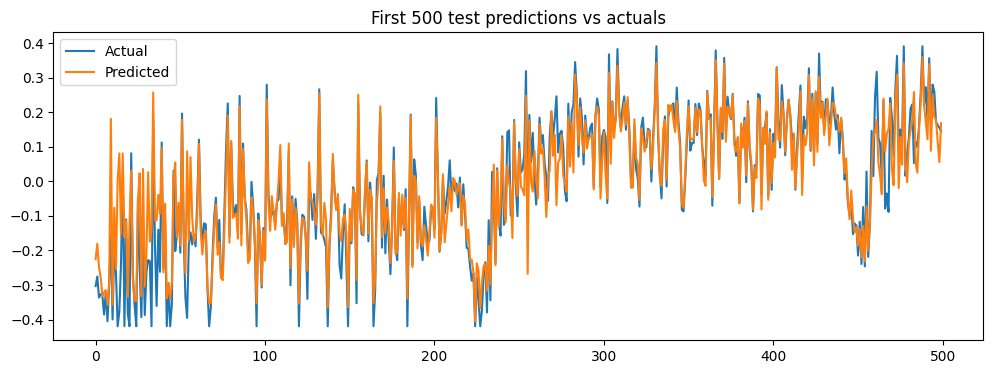

Test error l: 0.9080079150173885
Test error r: 0.19728507348919633
Test error m: 0.591031712896654
Overall Train Metrics:
MAE: 0.032480103622916374, RMSE: 0.0495161076866778, R²: 0.9164520595417844
Overall Test Metrics:
MAE: 0.03403292383790798, RMSE: 0.051413366463913646, R²: 0.9127298342502642
Overall Train Metrics R:
MAE: 0.3159070248922022, RMSE: 0.4684208301232701, R²: 0.6852636783663406
Overall Test Metrics R:
MAE: 0.476077888465886, RMSE: 0.7209098098828718, R²: 0.3242238798230389
Overall Train Metrics:
MAE: 1.0306509549307714, RMSE: 1.2837077927940954, R²: 0.6891989792693693
Overall Test Metrics:
MAE: 1.0916597244120148, RMSE: 1.3591852991462374, R²: 0.9127298342502642
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: log_consumption_wins
Treatment variable(s): ['log_price_wins']
Cluster variable(s): ['Country']
Covariates: ['HourOfWeek_19', 'PriceArea_SI', 'HourOfWeek_82', 'PriceArea_HR', 'HourO

In [41]:
dml_pliv_import, filtered_data_import, importance_df_import, fold_metrics_df_import, importance_all_folds_df_import, fold_coefficients_import = dml_rolling_window_log(processed_data_new, 
                                                                                                                             covariates_new, 
                                                                                                                             dependent_variable = 'log_consumption_wins',
                                                                                                                             manual_params_l=manual_params_l,
                                                                                                                             manual_params_r=manual_params_r,
                                                                                                                             manual_params_m=manual_params_m)

In [34]:
filtered_data_import.to_csv("log_model_lag_consumtion_df.csv", index=False)
importance_df_import.to_csv("log_model_lag_consumtion_importance.csv", index=False)
fold_coefficients_import = pd.DataFrame(fold_coefficients_import)
fold_coefficients_import.to_csv("log_model_lag_consumtion_fold_coef.csv", index=False)

In [19]:
def evaluate_predictions_country(predictions, true_values, target_name="TargetVariable", country_values=None, title="Country"):
    """
    Evaluate model predictions against true values with metrics and visualizations.

    Args:
        predictions (pd.Series or np.ndarray): Model's predicted values.
        true_values (pd.Series or np.ndarray): True values from the dataset.
        target_name (str): Name of the target variable (for labeling plots and messages).
        country_values (pd.Series or np.ndarray): Country values corresponding to the data for coloring.

    Returns:
        dict: Dictionary of metrics including MAE, RMSE, R², and percentage errors.
    """
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.colors as mcolors


    # Ensure inputs are aligned
    if isinstance(predictions, np.ndarray):
        predictions = pd.Series(predictions, index=true_values.index)

    # Calculate metrics
    metrics = calculate_metrics(true_values, predictions)
    print_metrics(metrics, dataset_type=f"Test - {target_name}")

    # Range and percentage error
    target_min = true_values.min()
    target_max = true_values.max()
    target_range = target_max - target_min
    print(f"{target_name} Range: Min = {target_min:.2f}, Max = {target_max:.2f}, Range = {target_range:.2f}")

    mae_pct = (metrics['MAE'] / target_range) * 100
    rmse_pct = (metrics['RMSE'] / target_range) * 100
    print(f"MAE as % of range: {mae_pct:.2f}%")
    print(f"RMSE as % of range: {rmse_pct:.2f}%")

    # Color mapping using Reds_cov from pycortex
    if country_values is not None:
        unique_countries = np.unique(country_values)
        num_countries = len(unique_countries)

        country_to_index = {country: idx for idx, country in enumerate(unique_countries)}
        norm = mcolors.Normalize(vmin=0, vmax=num_countries - 1)

        color_indices = [country_to_index[c] for c in country_values]
        dot_colors = cmap(norm(color_indices))
    else:
        dot_colors = 'gray'

    # Scatter plot: Predicted vs Actual
    plt.figure(figsize=(10, 6))
    plt.scatter(true_values, predictions, c=dot_colors, alpha=0.8)
    plt.plot([target_min, target_max], [target_min, target_max], 'r--', label='Perfect prediction')
    plt.title(f'Predicted vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel(f'Predicted {target_name}')
    plt.xlim(-1.5, target_max + 0.1)
    plt.ylim(-1.5, predictions.max() + 0.1)

    if country_values is not None:
        handles = [
            plt.Line2D([0], [0], marker='o',
                       color=cmap(norm(country_to_index[country])),
                       linestyle='', label=str(country))
            for country in unique_countries
        ]
        plt.legend(handles=handles, title=title, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

    # Residuals plot
    residuals = true_values - predictions
    plt.figure(figsize=(10, 6))
    plt.scatter(true_values, residuals, c=dot_colors, alpha=0.6)
    plt.axhline(0, color='red', linestyle='--', label='Zero Residual')
    plt.title(f'Residuals vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel('Residuals')
    plt.xlim(-1.6, target_max + 0.1)

    if country_values is not None:
        plt.legend(handles=handles, title=title, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

    return {
        "Metrics": metrics,
        "MAE_Percentage": mae_pct,
        "RMSE_Percentage": rmse_pct
    }



In [47]:
print("Min/Max of true values:")
print(filtered_data_import['log_consumption'].min(), filtered_data_import['log_consumption'].max())

print("Min/Max of predictions:")
print(filtered_data_import['Prrediction'].min(), filtered_data_import['Prrediction'].max())


Min/Max of true values:
-2.2819825209376816 0.9954125649827703
Min/Max of predictions:
-1.0894681215286255 0.7893415093421936


In [104]:
from matplotlib.colors import LinearSegmentedColormap

# Custom red gradient from light to deep red
RdGy_10_colors = [
    "#000000",  # red
    "#2f2f2f",  # tomato red
    "#797979",  # salmon
    "#bbbbbb",  # peach
    "#ff9999",  # soft pink
    "#ff665d",  # blush
    "#ef0000",  # light gray
    "#b20016",  # charcoal gray
]

cmap = mcolors.ListedColormap(RdGy_10_colors, name="RdGy_10")

Test - log_consumption Metrics:
  MAE: 0.0327
  RMSE: 0.0506
  R²: 0.9191
log_consumption Range: Min = -2.28, Max = 1.00, Range = 3.28
MAE as % of range: 1.00%
RMSE as % of range: 1.54%


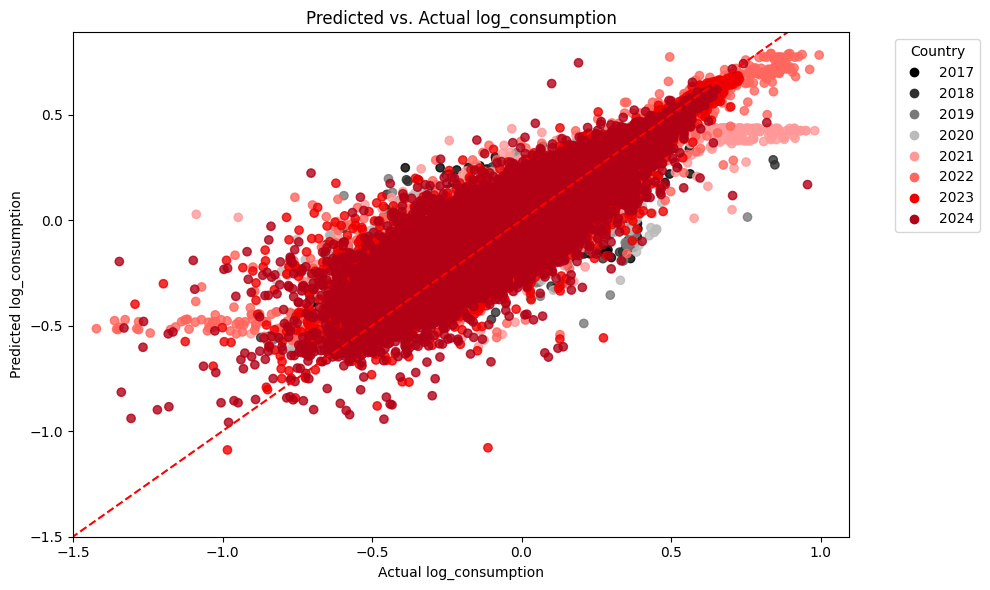

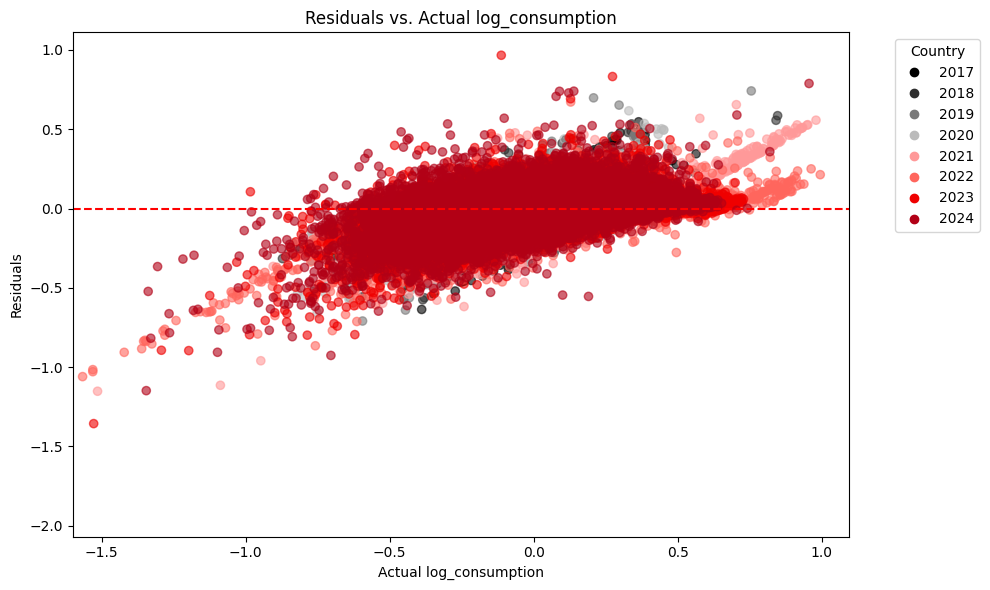

In [118]:
result = evaluate_predictions_country(
    predictions=filtered_data_import['Prrediction'],
    true_values=filtered_data_import['log_consumption'],
    target_name="log_consumption",
    country_values=filtered_data_import['Year']  # Use the Country column
)

In [123]:
def evaluate_predictions_country(predictions, true_values, target_name="TargetVariable", country_values=None, title="Country"):
    """
    Evaluate model predictions against true values with metrics and visualizations.

    Args:
        predictions (pd.Series or np.ndarray): Model's predicted values.
        true_values (pd.Series or np.ndarray): True values from the dataset.
        target_name (str): Name of the target variable (for labeling plots and messages).
        country_values (pd.Series or np.ndarray): Country values corresponding to the data for coloring.

    Returns:
        dict: Dictionary of metrics including MAE, RMSE, R², and percentage errors.
    """
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm
    import matplotlib.colors as mcolors

    # Use the reversed RdGy colormap: black (low) → red (high)
    cmap = cm.get_cmap("RdGy_r")

    # Ensure predictions align with true values
    if isinstance(predictions, np.ndarray):
        predictions = pd.Series(predictions, index=true_values.index)

    # Calculate metrics
    metrics = calculate_metrics(true_values, predictions)
    print_metrics(metrics, dataset_type=f"Test - {target_name}")

    # Value range and percentage metrics
    target_min = true_values.min()
    target_max = true_values.max()
    target_range = target_max - target_min
    print(f"{target_name} Range: Min = {target_min:.2f}, Max = {target_max:.2f}, Range = {target_range:.2f}")

    mae_pct = (metrics['MAE'] / target_range) * 100
    rmse_pct = (metrics['RMSE'] / target_range) * 100
    print(f"MAE as % of range: {mae_pct:.2f}%")
    print(f"RMSE as % of range: {rmse_pct:.2f}%")

    # Color mapping using RdGy_r
    if country_values is not None:
        unique_countries = np.unique(country_values)
        num_countries = len(unique_countries)

        # Normalize country indices to [0, 1] for continuous colormap
        country_to_index = {country: idx for idx, country in enumerate(unique_countries)}
        norm = mcolors.Normalize(vmin=0, vmax=num_countries - 1)
        color_indices = [country_to_index[c] for c in country_values]
        dot_colors = cmap(norm(color_indices))
    else:
        dot_colors = 'gray'

    # Scatter plot: Predicted vs Actual
    plt.figure(figsize=(10, 6))
    plt.scatter(true_values, predictions, c=dot_colors, alpha=0.6)
    plt.plot([target_min, target_max], [target_min, target_max], color='red', linestyle='--', label='Perfect prediction')
    plt.title(f'Predicted vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel(f'Predicted {target_name}')
    plt.xlim(-1.5, target_max + 0.1)
    plt.ylim(-1.5, predictions.max() + 0.1)

    if country_values is not None:
        handles = [
            plt.Line2D([0], [0], marker='o',
                       color=cmap(norm(country_to_index[country])),
                       linestyle='', label=str(country))
            for country in unique_countries
        ]
        plt.legend(handles=handles, title=title, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

    # Residuals plot
    residuals = true_values - predictions
    plt.figure(figsize=(10, 6))
    plt.scatter(true_values, residuals, c=dot_colors, alpha=0.6)
    plt.axhline(0, color='black', linestyle='--', label='Zero Residual')
    plt.title(f'Residuals vs. Actual {target_name}')
    plt.xlabel(f'Actual {target_name}')
    plt.ylabel('Residuals')
    plt.xlim(-1.6, target_max + 0.1)

    if country_values is not None:
        plt.legend(handles=handles, title=title, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

    return {
        "Metrics": metrics,
        "MAE_Percentage": mae_pct,
        "RMSE_Percentage": rmse_pct
    }


Test - log_consumption Metrics:
  MAE: 0.0327
  RMSE: 0.0506
  R²: 0.9191
log_consumption Range: Min = -2.28, Max = 1.00, Range = 3.28
MAE as % of range: 1.00%
RMSE as % of range: 1.54%


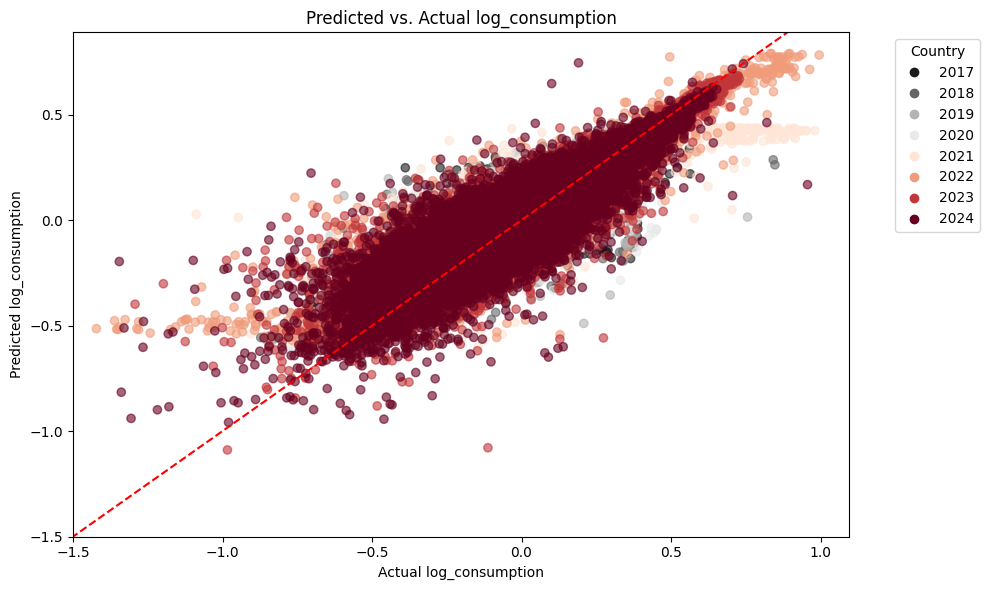

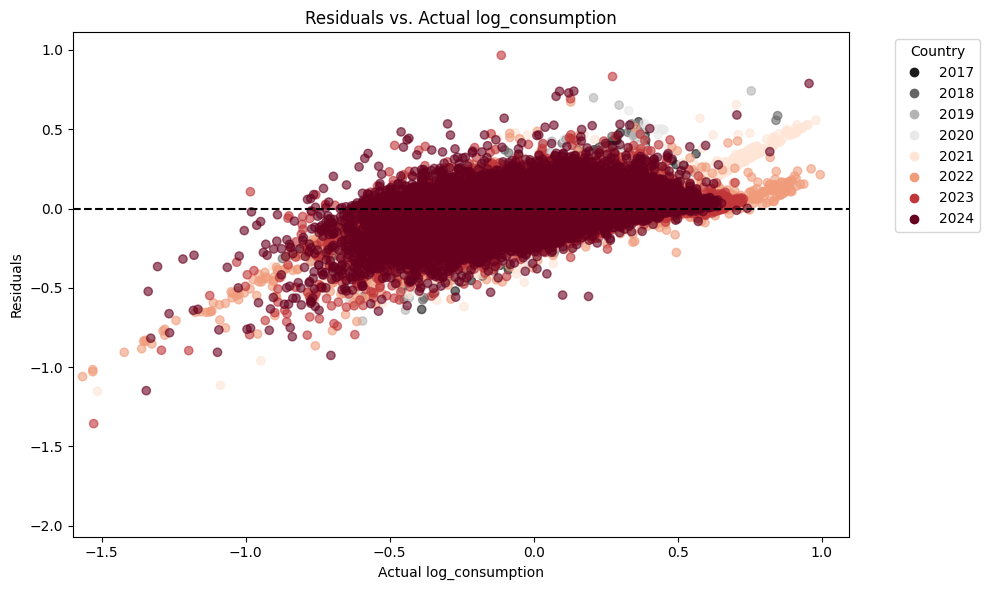

In [124]:
result = evaluate_predictions_country(
    predictions=filtered_data_import['Prrediction'],
    true_values=filtered_data_import['log_consumption'],
    target_name="log_consumption",
    country_values=filtered_data_import['Year']  # Use the Country column
)

In [ ]:
result = evaluate_predictions_country(
    predictions=filtered_data_import['Prrediction'],
    true_values=filtered_data_import['log_consumption'],
    target_name="log_consumption",
    country_values=filtered_data_import['Year']  # Use the Country column
)

In [90]:
pip install cortex

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py) ... done
  Created wheel for cortex: filename=cortex-0.42.1-py3-none-any.whl size=34079884 sha256=cbfcc21ea15349b7470fc09a566899bd562c210734722335e047e7185451216d
  Stored in directory: /tmp/pip-ephem-wheel-cache-vnrp71h1/wheels/f9/a0/eb/a9d2b70511153ce5a6b1004dd4a9271ba23c856c10731cc2c4
Successfully built cortex
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
Note: you may need to restart the kernel to use updated packages.


In [68]:
importance_df_import

,Feature,Mean Importance,Std Importance
113,Lag1_Consumption,0.255314,0.032661
104,block_1.0:tempbin,0.090658,0.021017
127,block_6.0:tempbin2,0.073846,0.021983
99,block_1.0:tempbin2,0.070999,0.011711
51,HourOfWeek_149,0.058043,0.036801
...,...,...,...
212,HourOfWeek_12,0.000000,0.000000
153,HourOfWeek_73,0.000000,0.000000
90,HourOfWeek_33,0.000000,0.000000
217,HourOfWeek_123,0.000000,0.000000


In [13]:
def prepare_data_with_dummies_and_interactions(
    data,
    base_covariates=None,
    include_interactions=None,
    dependent_variable='consumption_normalized',
    include_lags=True
):
    data = data.copy()
    data = data[data["PriceArea"] != "DE_AT_LU"]
    data = data[data["PriceArea"] != "IT_CALA"]
    data['Time'] = pd.to_datetime(data['Time'])
    data['Year'] = data['Time'].dt.year
    data = data.sort_values(by='Time')
    data['Country'] = data['PriceArea']
    data['consumption_normalized'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', data['Time'].dt.year])['ConsumptionValue'].transform('mean')
    )
    data['consumption_norm_peak'] = (
        data['ConsumptionValue'] / 
        data.groupby(['Country', 'Year'])['ConsumptionValue'].transform('max')
    )

    data['Total_Wind_Generation'] = (
        data['Wind_Offshore'].fillna(0) + data['Wind_Onshore'].fillna(0)
    )

    # Dummies
    data = pd.get_dummies(data, columns=['block'], drop_first=False)
    data = pd.get_dummies(data, columns=['PriceArea'], drop_first=False)
    price_area_columns = [col for col in data.columns if col.startswith('PriceArea_')]
    for col in price_area_columns:
        data[col] = data[col].astype(int)

    data['HourOfWeek'] = data['Time'].dt.dayofweek * 24 + data['Time'].dt.hour
    data = pd.get_dummies(data, columns=['HourOfWeek'], drop_first=False)

    data['Month'] = data['Time'].dt.month
    data = pd.get_dummies(data, columns=['Month'], drop_first=False)

    # Rolling features
    data['RollingMean24h'] = (
        data.groupby(['Country', 'Year'])['ConsumptionValue']
        .transform(lambda x: x.rolling(window=24, min_periods=12).mean())
    )
    data['Lag1_Price'] = data.groupby('Country')['DayAheadPriceEUR'].shift(1)
    data['RollingStd24_LaggedPrice'] = data.groupby(['Country', 'Year'])['Lag1_Price'].transform(
        lambda x: x.rolling(window=24, min_periods=12).std()
    )
    price_threshold = data['Lag1_Price'].quantile(0.95)
    data['LaggedPriceSpike'] = (data['Lag1_Price'] > price_threshold).astype(int)


    # Step 2: Add interaction terms if specified
    interaction_covariates = []
    block_dummy_columns = [col for col in data.columns if col.startswith('block_')]

    if include_interactions:
        for block_col in block_dummy_columns:
            if 'block' in include_interactions:
                for interaction_col in include_interactions['block']:
                    interaction_term = f'{block_col}:{interaction_col}'
                    data[interaction_term] = data[block_col] * data[interaction_col]
                    interaction_covariates.append(interaction_term)

        
    # Step 3: Optionally add lagged features
    lag_features = []
    if include_lags:
        data['Lag1_Consumption'] = data.groupby('Country')[dependent_variable].shift(1)
        lag_features = ['Lag1_Consumption']

    # Step 4: Define covariates
    if base_covariates is None:
        base_covariates = []
        
    all_features = base_covariates + lag_features

    for feat in all_features:
        if feat not in base_covariates:
            base_covariates.append(feat)

    covariates = list(set(base_covariates + interaction_covariates +
                          [col for col in data.columns if col.startswith('PriceArea_')] +
                          [col for col in data.columns if col.startswith('HourOfWeek_')] +
                          [col for col in data.columns if col.startswith('Month_')]))

    covariates = [col for col in covariates if not (col.startswith('block_') and ':' not in col)]

    endogenous_variable = 'DayAheadPriceEUR'
    instrument_variables = ['Total_Wind_Generation']

    key_variables = [dependent_variable, endogenous_variable] + instrument_variables + covariates
    filtered_processed_data = data.dropna(subset=key_variables)

    return filtered_processed_data, covariates

In [14]:
processed_data_new, covariates_new = prepare_data_with_dummies_and_interactions(
    data_1,
    base_covariates=['Price_gas', 'Price_coal', 'Price_EUA'],
    include_interactions={'block': ['tempbin', 'tempbin2', 'Solar_MWh']},
    dependent_variable = 'consumption_normalized'
)
processed_data_new = processed_data_new[processed_data_new['Time'].dt.year != 2025]
processed_data_new

,Unnamed: 0,Time,ConsumptionValue,DayAheadPriceEUR,WeatherWindSpeed,WeatherTemperature,Year,Day,Hour,WeatherTemperature_F,...,block_4.0:tempbin,block_4.0:tempbin2,block_4.0:Solar_MWh,block_5.0:tempbin,block_5.0:tempbin2,block_5.0:Solar_MWh,block_6.0:tempbin,block_6.0:tempbin2,block_6.0:Solar_MWh,Lag1_Consumption
Unnamed: 0.1,,,,,,,,,,,,,,,,,,,,,
21.0,28.0,2015-01-01 02:00:00,5879.00,20.27,5.878027,271.040405,2015,1.0,2.0,28.202729,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.822254
19.0,20.0,2015-01-01 02:00:00,21286.00,42.27,6.516034,278.325043,2015,1.0,2.0,41.315077,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.801737
18.0,23.0,2015-01-01 02:00:00,1745.00,14.60,11.060371,278.674744,2015,1.0,2.0,41.944539,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.795204
17.0,22.0,2015-01-01 02:00:00,1236.00,14.60,10.920368,277.208038,2015,1.0,2.0,39.304469,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.876283
20.0,26.0,2015-01-01 02:00:00,7397.00,35.47,3.526751,268.095337,2015,1.0,2.0,22.901606,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.078765
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,2024-12-31 23:00:00,10729.50,4.85,5.314154,265.901459,2024,31.0,23.0,18.952626,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.359202,0.0,1.181192
NaN,NaN,2024-12-31 23:00:00,4545.00,138.70,3.535453,283.701355,2024,31.0,23.0,50.992439,...,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.600229,0.0,0.835920
NaN,NaN,2024-12-31 23:00:00,1971.50,125.31,2.739260,277.086395,2024,31.0,23.0,39.085511,...,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.527677,0.0,1.011109



Test Year: 2017 | Training Years: 2015 to 2016
Train samples: 401794 | Test samples: 209955


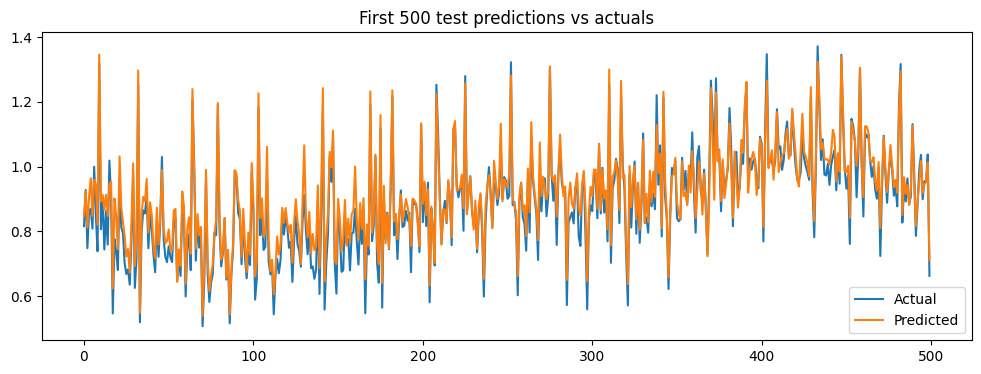

Test error l: 0.9647855932259124
Test error r: 0.2369654131788249
Test error m: 0.555638774521467

Test Year: 2018 | Training Years: 2016 to 2017
Train samples: 412296 | Test samples: 203206


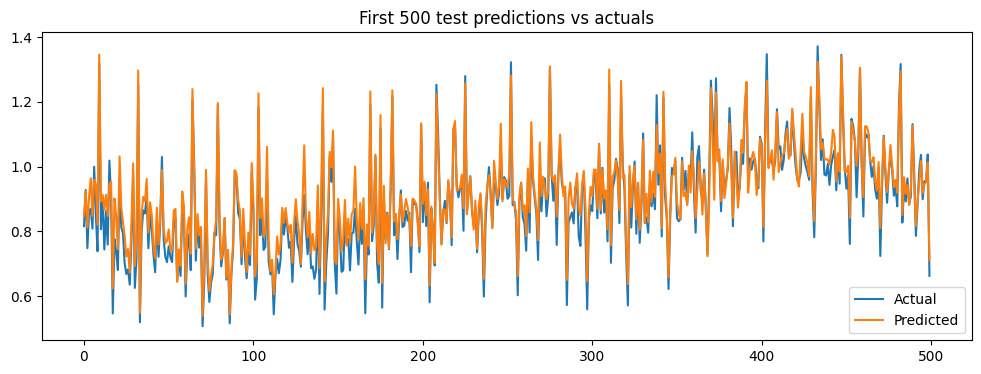

Test error l: 0.9610973243774914
Test error r: -0.002217309959254843
Test error m: 0.5918915711763929

Test Year: 2019 | Training Years: 2017 to 2018
Train samples: 413161 | Test samples: 221269


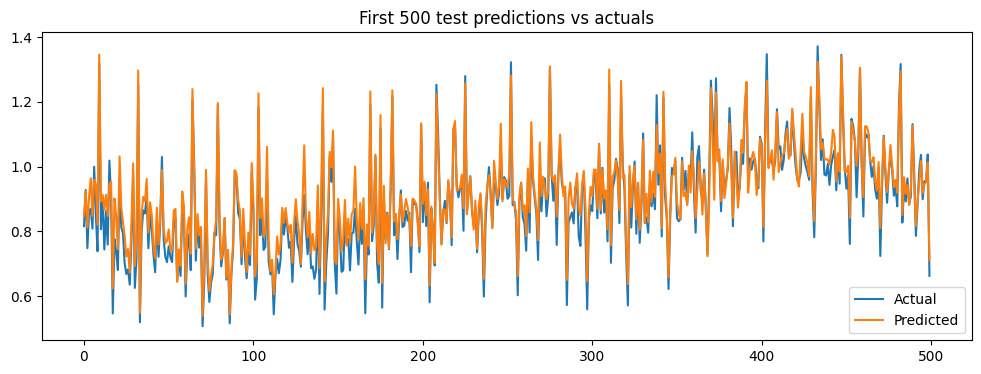

Test error l: 0.9656189418045086
Test error r: 0.2575840537491495
Test error m: 0.6031106617414183

Test Year: 2020 | Training Years: 2018 to 2019
Train samples: 424475 | Test samples: 234723


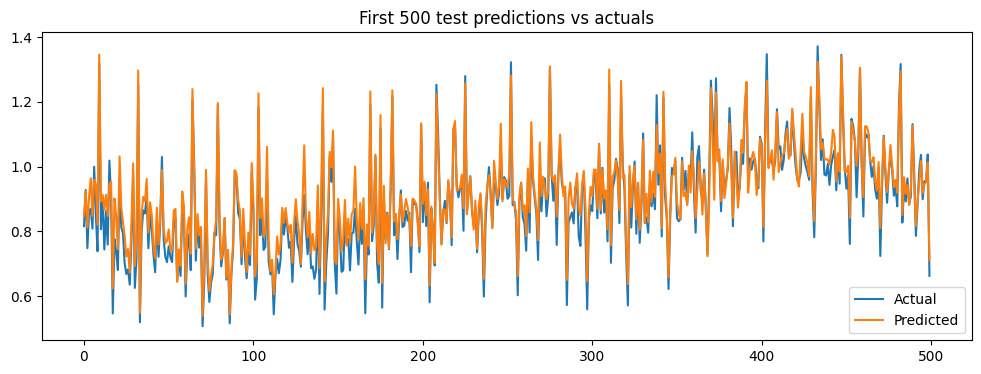

Test error l: 0.969233857643438
Test error r: 0.14325387387981914
Test error m: 0.6075411235755996

Test Year: 2021 | Training Years: 2019 to 2020
Train samples: 455992 | Test samples: 243599


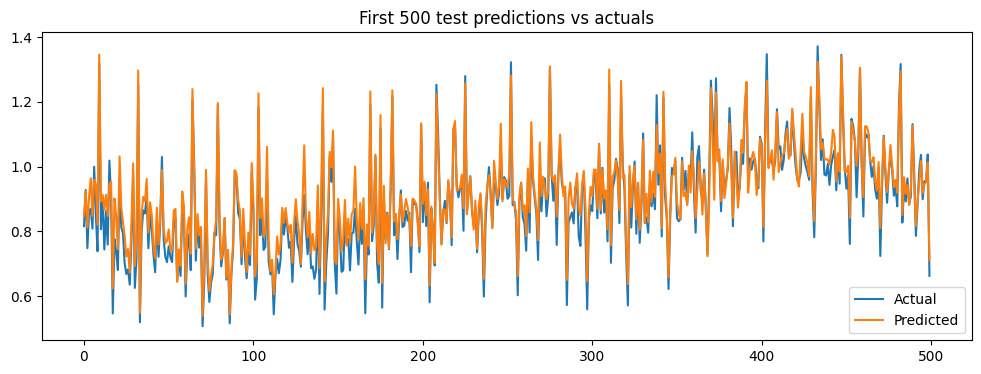

Test error l: 0.9650492725913232
Test error r: -0.6194048559122098
Test error m: 0.3615870154227333

Test Year: 2022 | Training Years: 2020 to 2021
Train samples: 478322 | Test samples: 274097


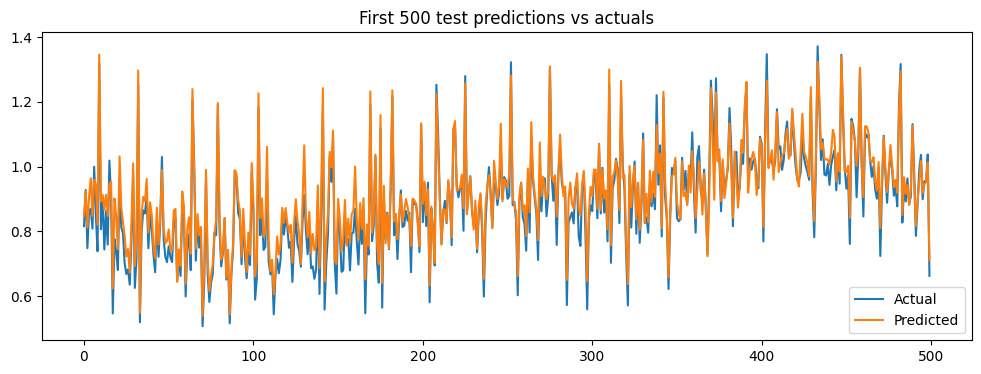

Test error l: 0.9530941739999641
Test error r: 0.31155363873815733
Test error m: 0.6363149890838815

Test Year: 2023 | Training Years: 2021 to 2022
Train samples: 517696 | Test samples: 281102


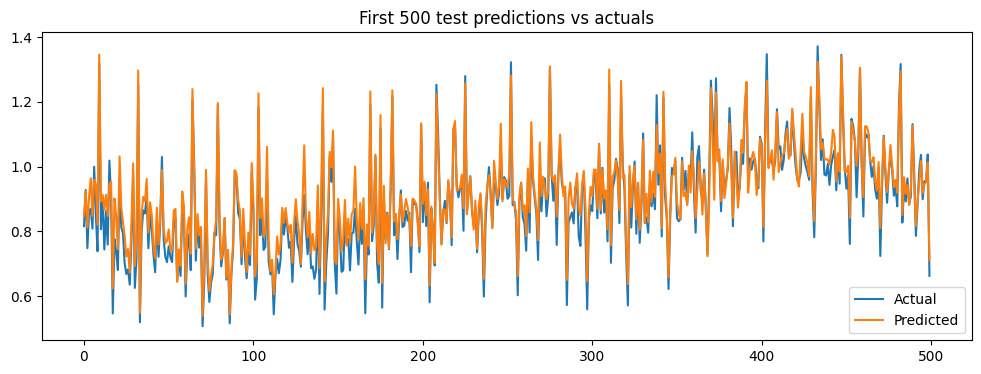

Test error l: 0.9574753165160697
Test error r: 0.19364537183319674
Test error m: 0.5774571819962961

Test Year: 2024 | Training Years: 2022 to 2023
Train samples: 555199 | Test samples: 295289


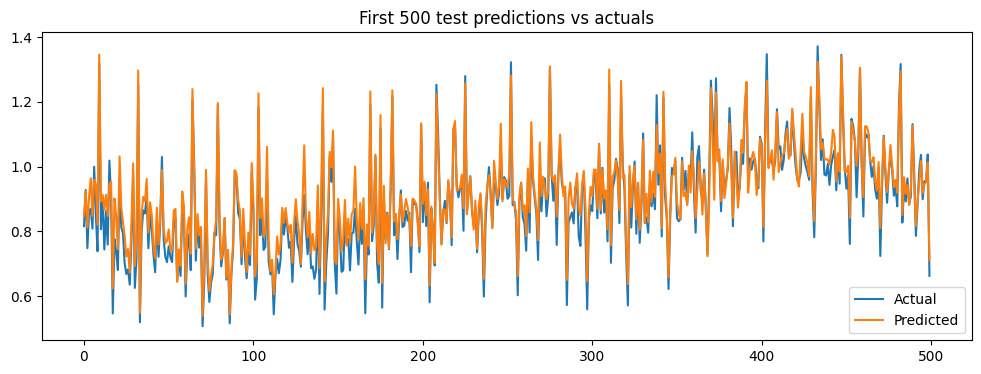

Test error l: 0.9595528921779425
Test error r: 0.15007347211220434
Test error m: 0.6206687013157952
Overall Train Metrics:
MAE: 0.025836176010113645, RMSE: 0.035553502565161516, R²: 0.9648399356144091
Overall Test Metrics:
MAE: 0.027348592220620555, RMSE: 0.0378363592455156, R²: 0.9614577213422464
================== DoubleMLPLIV Object ==================

------------------ Data summary      ------------------
Outcome variable: consumption_normalized
Treatment variable(s): ['DayAheadPriceEUR']
Cluster variable(s): ['Country']
Covariates: ['HourOfWeek_152', 'PriceArea_LT', 'HourOfWeek_51', 'PriceArea_SE_2', 'HourOfWeek_56', 'HourOfWeek_153', 'HourOfWeek_124', 'HourOfWeek_125', 'HourOfWeek_132', 'PriceArea_SI', 'HourOfWeek_31', 'HourOfWeek_17', 'HourOfWeek_97', 'HourOfWeek_43', 'HourOfWeek_81', 'HourOfWeek_10', 'HourOfWeek_29', 'HourOfWeek_131', 'PriceArea_IT_SUD', 'HourOfWeek_111', 'HourOfWeek_5', 'Month_1', 'HourOfWeek_38', 'HourOfWeek_57', 'Price_coal', 'HourOfWeek_15', 'HourOfWeek_13

In [16]:
dml_pliv_import, filtered_data_import, importance_df_import, fold_metrics_df_import, importance_all_folds_df_import, fold_coefficients_import = dml_rolling_window(processed_data_new, 
                                                                                                                             covariates_new, 
                                                                                                                             dependent_variable = 'consumption_normalized',
                                                                                                                             manual_params_l=manual_params_l,
                                                                                                                             manual_params_r=manual_params_r,
                                                                                                                             manual_params_m=manual_params_m)
          

Test - consumption_normalized Metrics:
  MAE: 0.0273
  RMSE: 0.0378
  R²: 0.9615
consumption_normalized Range: Min = 0.0, Max = 2.4783060241355925, Range = 2.4783060241355925
MAE as percentage of range: 1.10%
RMSE as percentage of range: 1.53%


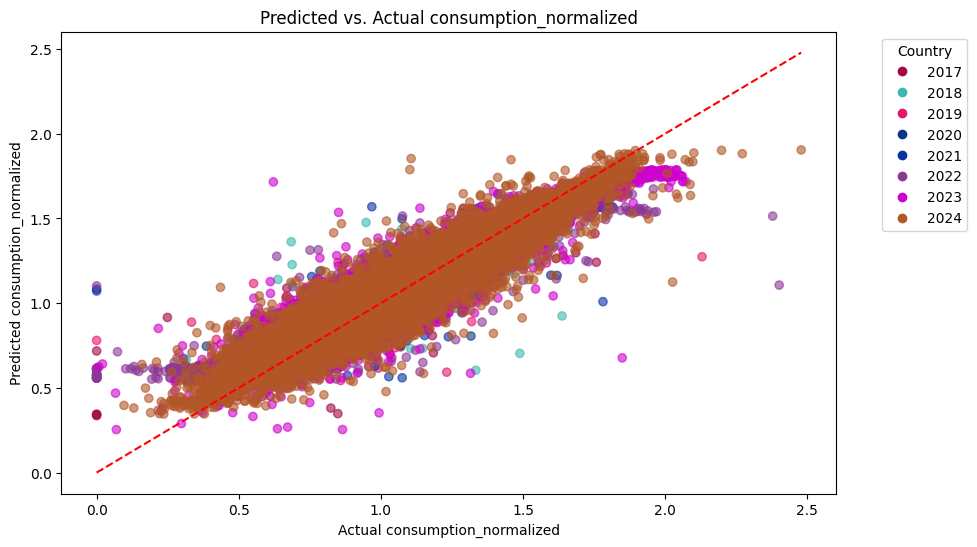

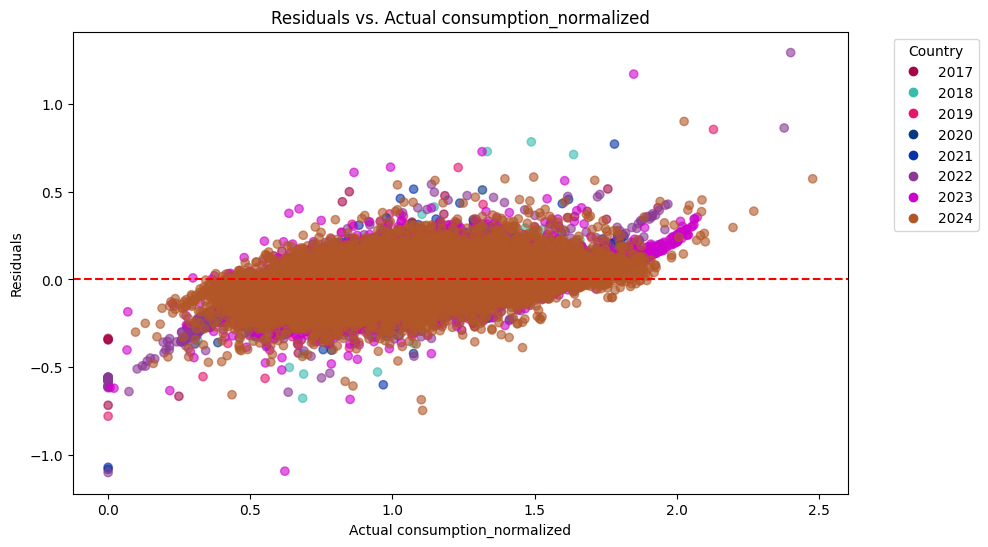

In [17]:
result = evaluate_predictions_country(
    predictions=filtered_data_import['Prrediction'],
    true_values=filtered_data_import['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data_import['Year']  # Use the Country column
)

Test - consumption_normalized Metrics:
  MAE: 0.0273
  RMSE: 0.0378
  R²: 0.9615
consumption_normalized Range: Min = 0.0, Max = 2.4783060241355925, Range = 2.4783060241355925
MAE as percentage of range: 1.10%
RMSE as percentage of range: 1.53%


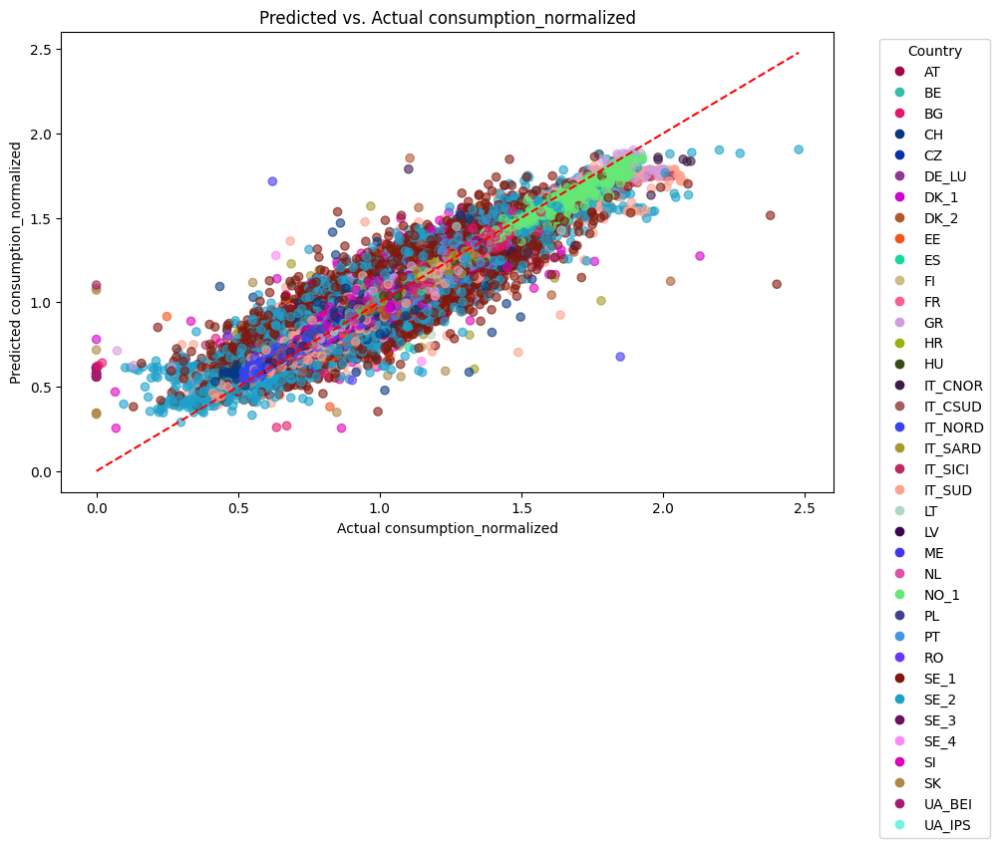

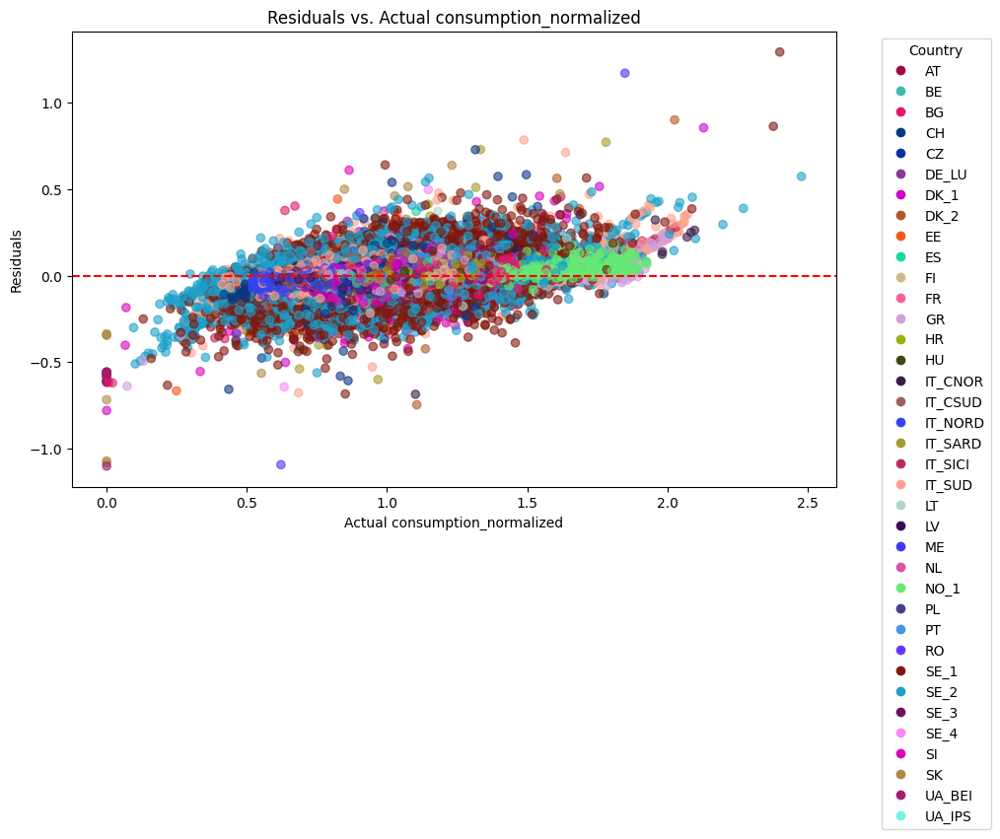

In [18]:
result = evaluate_predictions_country(
    predictions=filtered_data_import['Prrediction'],
    true_values=filtered_data_import['consumption_normalized'],
    target_name="consumption_normalized",
    country_values=filtered_data_import['Country']  # Use the Country column
)

In [19]:
filtered_data_import.to_csv("lag_consumtion_df.csv", index=False)
importance_df_import.to_csv("lag_consumtion_importance.csv", index=False)
fold_coefficients_import = pd.DataFrame(fold_coefficients_import)
fold_coefficients_import.to_csv("lag_consumtion_fold_coef.csv", index=False)